### Overview


Some important includes

In [ ]:
from pyspark.sql import SparkSession
from pyspark.sql import functions as F
from pyspark.sql.functions import year, spark_partition_id, count, regexp_extract, col, when, udf, isnan, length, desc
from pyspark.sql.types import StructType, StructField, StringType, ArrayType, IntegerType, MapType
import matplotlib.pyplot as plt
import seaborn as sns
from pyspark.sql import functions as F
from pyspark.sql.functions import lit
from pyspark.ml.feature import StopWordsRemover, Word2Vec, Tokenizer, StandardScalerModel, Word2VecModel, PCA, PCAModel
import re
from pyspark.ml.clustering import KMeansModel

try:
    from langdetect import detect
    from nltk.corpus import stopwords
    from nltk.stem import WordNetLemmatizer
    import contractions
    import plotly.io as pio

except:
    !pip install langdetect
    !pip install contractions
    !pip install nltk
    !pip install plotly

    from langdetect import detect
    from nltk.corpus import stopwords
    from nltk.stem import WordNetLemmatizer
    import contractions
    import plotly.io as pio

import plotly.io as pio
pio.renderers.default = 'databricks'


In [ ]:
spark = SparkSession \
    .builder \
    .appName("Clutering Analysis") \
    .getOrCreate()

spark

SparkSession - hive 
 
 
 SparkContext 

 Spark UI 

 
 Version 
 v3.3.2 
 Master 
 local[8] 
 AppName 
 Databricks Shell

In [ ]:
# Check default parallelism
sc = spark.sparkContext
sc.defaultParallelism

Out[3]: 8

In [ ]:
#Check default number of shuffle partitions
spark.conf.get( "spark.sql.shuffle.partitions" )

Out[4]: '200'

In [ ]:
# Here we 're working with a big dataframe and some relatively small datasets (where the data can fit into memory across the executors).
spark.conf.set("spark.sql.shuffle.partitions", 16)

In [ ]:
# Enable Adaptive Query Execution (AQE) in Spark to dynamically adjust shuffle partitions during execution
spark.conf.set("spark.sql.adaptive.enabled", "true")

In [ ]:
# This function is getting the number of records per parition to trace and optimize.
def getDataFrameStats(dataFrame):
    outputDF = (
                    dataFrame

                        # Get partition number for each record
                        .withColumn("Partition Number", spark_partition_id())

                        # Group by partition, and calculate stats for a column
                        .groupBy("Partition Number")

                        .agg(
                                  count("*").alias("Record Count")
                            )
                        
                        .orderBy("Partition Number")
               )

    return outputDF

In [ ]:
# Original dataset paths.
comm_use_subset_path    = "/databricks-datasets/COVID/CORD-19/2020-03-13/comm_use_subset/comm_use_subset/"
noncomm_use_subset_path = "/databricks-datasets/COVID/CORD-19/2020-03-13/noncomm_use_subset/noncomm_use_subset/"
biorxiv_medrxiv_path    = "/databricks-datasets/COVID/CORD-19/2020-03-13/biorxiv_medrxiv/biorxiv_medrxiv/"
json_schema_path        = "/databricks-datasets/COVID/CORD-19/2020-03-13/json_schema.txt"
meta_data_path          = "/databricks-datasets/COVID/CORD-19/2020-03-13/all_sources_metadata_2020-03-13.csv"

# Origianl dataframe paths as parquet.
comm_use_subset_pq_path     = "/FileStore/tables/COVID/comm_use_subset.parquet"
noncomm_use_subset_pq_path  = "/FileStore/tables/COVID/noncomm_use_subset.parquet"
biorxiv_medrxiv_pq_path     = "/FileStore/tables/COVID/biorxiv_medrxiv.parquet"
metadata_pq_path            = "/FileStore/tables/COVID/metadata.parquet" 

# Dataframe paths after EDA -> No dataframes has been altered in this stage.
# Load the data from the previous stage.

# Dataframe paths after prepared and cleaned.
combined_df_pq_clean_path         = "/FileStore/tables/COVID/combined_df_clean.parquet"

# Dataframe paths after preprocessed.
combined_df_pq_processed_path         = "/FileStore/tables/COVID/combined_df_processed.parquet"

# Dataframe path after vectorized + word2vec model path.
combined_df_pq_vectorized_path         = "/FileStore/tables/COVID/combined_df_vectorized.parquet"
word2vec_model_path                    = "/FileStore/tables/COVID/models/word2vec_model"

#Models'(scaled_model, pca_model and kmeans_model) paths
scaled_model_path                       = "/FileStore/tables/COVID/models/scaled_model"
pca_model_path                          = "/FileStore/tables/COVID/models/pca_model"
kmeans_model_path                       = "/FileStore/tables/COVID/models/kmeans_model"
clustered_df_pq_path                    = "/FileStore/tables/COVID/clustered_df_pq.parquet"

In [ ]:
def save_checkpoint(checkpoint="Preprocessing"):
    global comm_use_subset     
    global noncomm_use_subset 
    global biorxiv_medrxiv
    global metadata
    global combined_df
    global clustered_df

    #Models 
    global word2vec_model
    global scaled_model
    global pca_model
    global model
    try:
        if checkpoint == "original_pq" or checkpoint == "EDA":
            # Save the DataFrames back to their respective directories, overwriting the existing files
            comm_use_subset.write.mode('overwrite').parquet(comm_use_subset_pq_path)
            noncomm_use_subset.write.mode('overwrite').parquet(noncomm_use_subset_pq_path)
            biorxiv_medrxiv.write.mode('overwrite').parquet(biorxiv_medrxiv_pq_path)
            metadata.write.mode('overwrite').parquet(metadata_pq_path)

        elif checkpoint == "cleaned":
            combined_df.write.mode('overwrite').parquet(combined_df_pq_clean_path)      

        elif checkpoint == "processed":
            combined_df.write.mode('overwrite').parquet(combined_df_pq_processed_path)

        elif checkpoint == "vectorized":
            combined_df.write.mode('overwrite').parquet(combined_df_pq_vectorized_path)
            word2vec_model.write().overwrite().save(word2vec_model_path)

        elif checkpoint == "clustered":
            scaled_model.write().overwrite().save(scaled_model_path)
            pca_model.write().overwrite().save(pca_model_path)
            model.write().overwrite().save(kmeans_model_path)
            clustered_df.write.mode('overwrite').parquet(clustered_df_pq_path)
    except Exception as e:
        print(f"Parquet files saving failed with error {str(e)}")

#### Defining the Schemas for Efficient Data Loading  

##### Why Use a Schema?  
Initially, we attempted to read the datasets **without explicitly defining a schema**. However, this approach had **severe performance issues**:  

- The cluster **terminated after one hour**, processing only about **3,000 records**.  
- Reading just **one dataset** was estimated to take approximately **2 hours and 40 minutes**—making it impractical for our workload.  

##### The Power of Schema Definition  
By explicitly defining the schema **before loading the data**, we achieved **massive performance improvements**:  

- **All three datasets were loaded in just 3 minutes**—a dramatic speed-up.  
- **Avoided Spark’s slow inference step**, which was causing bottlenecks.  
- **Reduced memory overhead** by preventing unnecessary type conversions.  

This highlights why defining schemas is a **best practice** when dealing with large datasets in Spark! ⚡


Define dataset schemas

In [ ]:
metadata_schema = StructType([
    StructField("sha", StringType(), True),
    StructField("source_x", StringType(), True),
    StructField("title", StringType(), True),
    StructField("doi", StringType(), True),
    StructField("pmcid", StringType(), True),
    StructField("pubmed_id", StringType(), True),
    StructField("license", StringType(), True),
    StructField("abstract", StringType(), True),
    StructField("publish_time", StringType(), True),
    StructField("authors", StringType(), True),
    StructField("journal", StringType(), True),
    StructField("Microsoft Academic Paper ID", StringType(), True),
    StructField("WHO #Covidence", StringType(), True),
    StructField("has_full_text", StringType(), True)
])

In [ ]:
def generate_cord19_schema():
    """Generate a Spark schema based on the semi-textual description of CORD-19 Dataset.

    This captures most of the structure from the crawled documents, and has been
    tested with the 2020-03-13 dump provided by the CORD-19 Kaggle competition.
    The schema is available at [1], and is also provided in a copy of the
    challenge dataset.

    One improvement that could be made to the original schema is to write it as
    JSON schema, which could be used to validate the structure of the dumps. I
    also noticed that the schema incorrectly nests fields that appear after the
    `metadata` section e.g. `abstract`.
    
    [1] https://ai2-semanticscholar-cord-19.s3-us-west-2.amazonaws.com/2020-03-13/json_schema.txt
    """

    # shared by `metadata.authors` and `bib_entries.[].authors`
    author_fields = [
        StructField("first", StringType()),
        StructField("middle", ArrayType(StringType())),
        StructField("last", StringType()),
        StructField("suffix", StringType()),
    ]

    authors_schema = ArrayType(
        StructType(
            author_fields
            + [
                # Uncomment to cast field into a JSON string. This field is not
                # well-specified in the source.
                StructField(
                    "affiliation",
                    StructType(
                        [
                            StructField("laboratory", StringType()),
                            StructField("institution", StringType()),
                            StructField(
                                "location",
                                StructType(
                                    [
                                        StructField("settlement", StringType()),
                                        StructField("country", StringType()),
                                    ]
                                ),
                            ),
                        ]
                    ),
                ),
                StructField("email", StringType()),
            ]
        )
    )

    # used in `section_schema` for citations, references, and equations
    spans_schema = ArrayType(
        StructType(
            [
                # character indices of inline citations
                StructField("start", IntegerType()),
                StructField("end", IntegerType()),
                StructField("text", StringType()),
                StructField("ref_id", StringType()),
            ]
        )
    )

    # A section of the paper, which includes the abstract, body, and back matter.
    section_schema = ArrayType(
        StructType(
            [
                StructField("text", StringType()),
                StructField("cite_spans", spans_schema),
                StructField("ref_spans", spans_schema),
                # While equations don't appear in the abstract, but appear here
                # for consistency
                StructField("eq_spans", spans_schema),
                StructField("section", StringType()),
            ]
        )
    )

    bib_schema = MapType(
        StringType(),
        StructType(
            [
                StructField("ref_id", StringType()),
                StructField("title", StringType()),
                StructField("authors", ArrayType(StructType(author_fields))),
                StructField("year", IntegerType()),
                StructField("venue", StringType()),
                StructField("volume", StringType()),
                StructField("issn", StringType()),
                StructField("pages", StringType()),
                StructField(
                    "other_ids",
                    StructType([StructField("DOI", ArrayType(StringType()))]),
                ),
            ]
        ),
        True,
    )

    # Can be one of table or figure captions
    ref_schema = MapType(
        StringType(),
        StructType(
            [
                StructField("text", StringType()),
                # Likely equation spans, not included in source schema, but
                # appears in JSON
                StructField("latex", StringType()),
                StructField("type", StringType()),
            ]
        ),
    )

    return StructType(
        [
            StructField("paper_id", StringType()),
            StructField(
                "metadata",
                StructType(
                    [
                        StructField("title", StringType()),
                        StructField("authors", authors_schema),
                    ]
                ),
                True,
            ),
            StructField("abstract", section_schema),
            StructField("body_text", section_schema),
            StructField("bib_entries", bib_schema),
            StructField("ref_entries", ref_schema),
            StructField("back_matter", section_schema),
        ]
    )



In [ ]:
def load_original_data(number_of_files):
    global comm_use_subset     
    global noncomm_use_subset 
    global biorxiv_medrxiv
    global metadata
    global comm_use_subset_selected_files
    global noncomm_use_subset_selected_files
    global biorxiv_medrxiv_selected_files

    # List the files in the directories
    comm_use_subset_files = dbutils.fs.ls(comm_use_subset_path)
    noncomm_use_subset_files = dbutils.fs.ls(noncomm_use_subset_path)
    biorxiv_medrxiv_files = dbutils.fs.ls(biorxiv_medrxiv_path)

    # Specify the files you want to read (e.g., the first few files)
    # Here we just use specific filenames.
    comm_use_subset_selected_files = comm_use_subset_files #[:number_of_files]  # Select first 1000 files
    noncomm_use_subset_selected_files = noncomm_use_subset_files #[:number_of_files]  # Select first 1000 files
    biorxiv_medrxiv_selected_files = biorxiv_medrxiv_files #[:number_of_files]  # Select first 1000 files

    json_files_schema = generate_cord19_schema()
    # Read the selected files using the schema
    comm_use_subset =      spark.read \
                                .option("multiLine", True) \
                                .schema(json_files_schema) \
                                .json([file.path for file in comm_use_subset_selected_files])

    noncomm_use_subset =   spark.read \
                                .option("multiLine", True) \
                                .schema(json_files_schema) \
                                .json([file.path for file in noncomm_use_subset_selected_files])

    biorxiv_medrxiv =      spark.read \
                                .option("multiLine", True) \
                                .schema(json_files_schema) \
                                .json([file.path for file in biorxiv_medrxiv_selected_files])

    metadata = spark.read.csv(meta_data_path, 
                              header=True, 
                              schema=metadata_schema)

def load_original_data_pq():
    global comm_use_subset     
    global noncomm_use_subset 
    global biorxiv_medrxiv
    global metadata

    # Load Parquet files into a DataFrame
    comm_use_subset     = spark.read.parquet(comm_use_subset_pq_path)
    noncomm_use_subset  = spark.read.parquet(noncomm_use_subset_pq_path)
    biorxiv_medrxiv     = spark.read.parquet(biorxiv_medrxiv_pq_path)
    metadata            = spark.read.parquet(metadata_pq_path)

def load_latest_checkpoint(checkpoint="Preprocessing", number_of_files=20):
    global comm_use_subset     
    global noncomm_use_subset 
    global biorxiv_medrxiv
    global metadata
    global combined_df
    global clustered_df

    #Models 
    global word2vec_model
    global scaled_model
    global pca_model
    global model

    if checkpoint == "original":
        load_original_data(number_of_files)

    elif checkpoint == "original_pq":
        load_original_data_pq()

    elif checkpoint == "cleaned":
        combined_df     = spark.read.parquet(combined_df_pq_clean_path)

    elif checkpoint == "processed":
        combined_df     = spark.read.parquet(combined_df_pq_processed_path)

    elif checkpoint == "vectorized":
        combined_df     = spark.read.parquet(combined_df_pq_vectorized_path)
        word2vec_model = Word2VecModel.load(word2vec_model_path)
    
    elif checkpoint == "clustered":
        clustered_df     = spark.read.parquet(clustered_df_pq_path)
        word2vec_model = Word2VecModel.load(word2vec_model_path)
        scaled_model = StandardScalerModel.load(scaled_model_path)
        pca_model = PCAModel.load(pca_model_path)
        model = KMeansModel.load(kmeans_model_path)

        

### 1. Read the dataset using _spark_

In [ ]:
%fs ls /databricks-datasets/COVID/CORD-19/2020-03-13/

path,name,size,modificationTime
dbfs:/databricks-datasets/COVID/CORD-19/2020-03-13/COVID.DATA.LIC.AGMT.pdf,COVID.DATA.LIC.AGMT.pdf,26690,1585887288000
dbfs:/databricks-datasets/COVID/CORD-19/2020-03-13/all_sources_metadata_2020-03-13.csv,all_sources_metadata_2020-03-13.csv,49211745,1585887288000
dbfs:/databricks-datasets/COVID/CORD-19/2020-03-13/all_sources_metadata_2020-03-13.readme,all_sources_metadata_2020-03-13.readme,1000,1585887288000
dbfs:/databricks-datasets/COVID/CORD-19/2020-03-13/biorxiv_medrxiv/,biorxiv_medrxiv/,0,0
dbfs:/databricks-datasets/COVID/CORD-19/2020-03-13/comm_use_subset/,comm_use_subset/,0,0
dbfs:/databricks-datasets/COVID/CORD-19/2020-03-13/json_schema.txt,json_schema.txt,2906,1585887559000
dbfs:/databricks-datasets/COVID/CORD-19/2020-03-13/noncomm_use_subset/,noncomm_use_subset/,0,0
dbfs:/databricks-datasets/COVID/CORD-19/2020-03-13/pmc_custom_license/,pmc_custom_license/,0,0


###### First, let's read the data as json.

In [ ]:
load_latest_checkpoint(checkpoint="original")

In [ ]:
comm_use_subset.printSchema()

root
 |-- paper_id: string (nullable = true)
 |-- metadata: struct (nullable = true)
 |    |-- title: string (nullable = true)
 |    |-- authors: array (nullable = true)
 |    |    |-- element: struct (containsNull = true)
 |    |    |    |-- first: string (nullable = true)
 |    |    |    |-- middle: array (nullable = true)
 |    |    |    |    |-- element: string (containsNull = true)
 |    |    |    |-- last: string (nullable = true)
 |    |    |    |-- suffix: string (nullable = true)
 |    |    |    |-- affiliation: struct (nullable = true)
 |    |    |    |    |-- laboratory: string (nullable = true)
 |    |    |    |    |-- institution: string (nullable = true)
 |    |    |    |    |-- location: struct (nullable = true)
 |    |    |    |    |    |-- settlement: string (nullable = true)
 |    |    |    |    |    |-- country: string (nullable = true)
 |    |    |    |-- email: string (nullable = true)
 |-- abstract: array (nullable = true)
 |    |-- element: struct (containsNull =

In [ ]:
metadata.printSchema()

root
 |-- sha: string (nullable = true)
 |-- source_x: string (nullable = true)
 |-- title: string (nullable = true)
 |-- doi: string (nullable = true)
 |-- pmcid: string (nullable = true)
 |-- pubmed_id: string (nullable = true)
 |-- license: string (nullable = true)
 |-- abstract: string (nullable = true)
 |-- publish_time: string (nullable = true)
 |-- authors: string (nullable = true)
 |-- journal: string (nullable = true)
 |-- Microsoft Academic Paper ID: string (nullable = true)
 |-- WHO #Covidence: string (nullable = true)
 |-- has_full_text: string (nullable = true)



###### Get the physical size of the data.

In [ ]:
# Get file information
metadata_file_info = dbutils.fs.ls(meta_data_path)

# Since it's just one file, we can directly access its size
metadata_file_size = metadata_file_info[0].size / (1024**2)  # Convert size from bytes to MB

print(f"Size of the metadata file: {metadata_file_size:.2f} MB")


Size of the metadata file: 46.93 MB


In [ ]:
# Calculate total size for each dataset
comm_use_subset_total_size = sum(file.size for file in comm_use_subset_selected_files) / (1024**2)  # Convert to MB
noncomm_use_subset_total_size = sum(file.size for file in noncomm_use_subset_selected_files) / (1024**2)  # Convert to MB
biorxiv_medrxiv_total_size = sum(file.size for file in biorxiv_medrxiv_selected_files) / (1024**2)  # Convert to MB

# Print the total sizes
print(f"Total size of comm_use_subset: {comm_use_subset_total_size:.2f} MB")
print(f"Total size of noncomm_use_subset: {noncomm_use_subset_total_size:.2f} MB")
print(f"Total size of biorxiv_medrxiv: {biorxiv_medrxiv_total_size:.2f} MB")

Total size of comm_use_subset: 1177.21 MB
Total size of noncomm_use_subset: 210.51 MB
Total size of biorxiv_medrxiv: 69.65 MB


Get how many patitions each dataframe takes, then we could get insight to repartition.

In [ ]:
# Check the number of partitions
comm_use_partitions         = comm_use_subset.rdd.getNumPartitions()
noncomm_use_partitions      = noncomm_use_subset.rdd.getNumPartitions()
biorxiv_medrxiv_partitions  = biorxiv_medrxiv.rdd.getNumPartitions()

print(f"comm_use_subset partitions: {comm_use_partitions}")
print(f"noncomm_use_subset partitions: {noncomm_use_partitions}")
print(f"biorxiv_medrxiv partitions: {biorxiv_medrxiv_partitions}")

comm_use_subset partitions: 286
noncomm_use_subset partitions: 63
biorxiv_medrxiv partitions: 26


In [ ]:
print(f"metadata number of partitions: {metadata.rdd.getNumPartitions()}")

metadata number of partitions: 8


In [ ]:
# Get the value of maxPartitionBytes
max_partition_bytes = spark.conf.get("spark.sql.files.maxPartitionBytes")

# Remove the 'b' suffix and convert to an integer
max_partition_bytes = int(max_partition_bytes.rstrip('b'))

# Print in MB for clarity
print(f"Max Partition Size: {max_partition_bytes / (1024**2):.2f} MB")


Max Partition Size: 128.00 MB


#### Partitioning Recommendation for JSON Data

##### Dataset Sizes and Maximum Partition Size:
- **comm_use_subset**: 1177.21 MB  
- **noncomm_use_subset**: 210.51 MB  
- **biorxiv_medrxiv**: 69.65 MB  
- **metadata**: 46.93 MB  
- **Max Partition Size**: 128.00 MB  

##### Calculations for Number of Partitions:
To determine the number of partitions, we use the formula:  
\\[
\text{Number of Partitions} = \\lceil \\frac{\\text{Total Size}}{\\text{Max Partition Size}} \\rceil
\\]

- **comm_use_subset**:  
\\[
\text{Partitions} = \\lceil \\frac{1177.21}{128} \\rceil = \\lceil 9.2 \\rceil = 10
\\]

- **noncomm_use_subset**:  
\\[
\text{Partitions} = \\lceil \\frac{210.51}{128} \\rceil = \\lceil 1.64 \\rceil = 2
\\]

- **biorxiv_medrxiv**:  
\\[
\text{Partitions} = \\lceil \\frac{69.65}{128} \\rceil = \\lceil 0.54 \\rceil = 1
\\]

- **metadata**:  
\\[
\text{Partitions} = \\lceil \\frac{46.93}{128} \\rceil = \\lceil 0.37 \\rceil = 1
\\]

##### Recommended Number of Partitions:
- **comm_use_subset**: 16 partitions  
- **noncomm_use_subset**: 8 partitions  
- **biorxiv_medrxiv**: 8 partition  
- **metadata**: 8 partition  


##### Repartition vs. colease?!

In [ ]:
# For comm_use_subset -> The calculations above was mad for the whole dataset size but we here are using just almost 1/6 of the dataset.
comm_use_subset = comm_use_subset.coalesce(16)  # Repartition to ~128 MB partitions

# For noncomm_use_subset
noncomm_use_subset = noncomm_use_subset.coalesce(8)  # Reduce to ~128 MB

# For biorxiv_medrxiv
biorxiv_medrxiv = biorxiv_medrxiv.coalesce(8)  # Single partition

# # For metadata -> already 8 partitions so, no need to repartition.
# metadata = metadata.coalesce(8)  # Single partition


##### Performance Analysis: Writing to Delta Format with Optimization

The previous cell took approximately **23 minutes** to write the data into Parquet files. 

To explore potential performance improvements, we will use **Delta Lake** as the storage format instead of Parquet. Delta Lake offers features like transaction support, versioning, and optimizations, which can enhance both the writing process and subsequent queries.

###### Writing Data to Delta Format

The datasets are written to Delta format with **8 partitions** for balanced data distribution. This step replaces the Parquet writing process:

```python
comm_use_subset.repartition(8).write.format("delta").mode("overwrite").save(comm_use_subset_pq_path)
noncomm_use_subset.repartition(8).write.format("delta").mode("overwrite").save(noncomm_use_subset_pq_path)
biorxiv_medrxiv.repartition(8).write.format("delta").mode("overwrite").save(biorxiv_medrxiv_pq_path)
```

###### Optimizing Delta Tables

Delta Lake allows table optimizations such as **compaction**, which consolidates small files to improve query performance and reduce I/O overhead. Here's how to optimize the Delta tables created above:

```python
from delta.tables import DeltaTable

# Load the Delta Tables
comm_use_delta_table = DeltaTable.forPath(spark, comm_use_subset_pq_path)
noncomm_use_delta_table = DeltaTable.forPath(spark, noncomm_use_subset_pq_path)
biorxiv_medrxiv_delta_table = DeltaTable.forPath(spark, biorxiv_medrxiv_pq_path)

# Optimize and compact Delta Tables
comm_use_delta_table.optimize().executeCompaction()
noncomm_use_delta_table.optimize().executeCompaction()
biorxiv_medrxiv_delta_table.optimize().executeCompaction()
```

###### Expected Benefits

1. **Improved Writing Time:** Delta Lake may offer faster write times due to its optimized storage layer.
2. **Reduced Query Latency:** Compacting the Delta tables consolidates small files, leading to better query performance.
3. **Storage Efficiency:** Delta's file format and optimizations may result in reduced overall storage usage.

This approach leverages Delta Lake's features to potentially improve the performance and usability of our datasets.


In [ ]:
files_in_biorxiv_medrxiv = dbutils.fs.ls("dbfs:/databricks-datasets/COVID/CORD-19/2020-03-13/biorxiv_medrxiv/biorxiv_medrxiv/")
for file in files_in_biorxiv_medrxiv:
    print(f"File: {file.path}, Size: {file.size / (1024**2):.2f} MB")


File: dbfs:/databricks-datasets/COVID/CORD-19/2020-03-13/biorxiv_medrxiv/biorxiv_medrxiv/0015023cc06b5362d332b3baf348d11567ca2fbb.json, Size: 0.07 MB
File: dbfs:/databricks-datasets/COVID/CORD-19/2020-03-13/biorxiv_medrxiv/biorxiv_medrxiv/004f0f8bb66cf446678dc13cf2701feec4f36d76.json, Size: 0.01 MB
File: dbfs:/databricks-datasets/COVID/CORD-19/2020-03-13/biorxiv_medrxiv/biorxiv_medrxiv/00d16927588fb04d4be0e6b269fc02f0d3c2aa7b.json, Size: 0.09 MB
File: dbfs:/databricks-datasets/COVID/CORD-19/2020-03-13/biorxiv_medrxiv/biorxiv_medrxiv/013d9d1cba8a54d5d3718c229b812d7cf91b6c89.json, Size: 0.09 MB
File: dbfs:/databricks-datasets/COVID/CORD-19/2020-03-13/biorxiv_medrxiv/biorxiv_medrxiv/01d162d7fae6aaba8e6e60e563ef4c2fca7b0e18.json, Size: 0.09 MB
File: dbfs:/databricks-datasets/COVID/CORD-19/2020-03-13/biorxiv_medrxiv/biorxiv_medrxiv/01e3b313e78a352593be2ff64927192af66619b5.json, Size: 0.10 MB
File: dbfs:/databricks-datasets/COVID/CORD-19/2020-03-13/biorxiv_medrxiv/biorxiv_medrxiv/02201e4601a

In [ ]:
save_checkpoint(checkpoint="original_pq")

### 2. EDA

In [ ]:
load_latest_checkpoint(checkpoint="original_pq")

In [ ]:
# Check the number of partitions
comm_use_partitions         = comm_use_subset.rdd.getNumPartitions()
noncomm_use_partitions      = noncomm_use_subset.rdd.getNumPartitions()
biorxiv_medrxiv_partitions  = biorxiv_medrxiv.rdd.getNumPartitions()
metadata_partitions         = metadata.rdd.getNumPartitions()

print(f"comm_use_subset partitions: {comm_use_partitions}")
print(f"noncomm_use_subset partitions: {noncomm_use_partitions}")
print(f"biorxiv_medrxiv partitions: {biorxiv_medrxiv_partitions}")
print(f"metadata partitions: {metadata_partitions}")

comm_use_subset partitions: 10
noncomm_use_subset partitions: 7
biorxiv_medrxiv partitions: 7
metadata partitions: 8


In [ ]:
# For comm_use_subset.
comm_use_subset = comm_use_subset.repartition(16) 

# For noncomm_use_subset
noncomm_use_subset = noncomm_use_subset.repartition(8) 

# For biorxiv_medrxiv
biorxiv_medrxiv = biorxiv_medrxiv.repartition(8) 

# For metadata
metadata = metadata.repartition(8) 


In [ ]:
from pyspark.sql.functions import col, count, when, isnan, countDistinct, desc, length, year

def EDA(df):
    # 1. Summary Statistics
    print("Summary Statistics")
    display(df.summary())

    # Get numerical columns only (for isnan check)
    numerical_cols = [c for c, dtype in df.dtypes if dtype in ["double", "float", "int", "bigint"]]

    # 2. Missing Values Check
    print("\nMissing Values per Column")
    null_counts = df.select([count(when(col(c).isNull(), c)).alias(c) for c in df.columns])
    display(null_counts)

    # 3. NaN Check (Only for Numerical Columns)
    if numerical_cols:
        print("\nNaN Count per Numerical Column")
        nan_counts = df.select([count(when(isnan(c), c)).alias(c) for c in numerical_cols])
        display(nan_counts)

    # 7. Distribution of Text Length (for Title & Abstract)
    try:
        if "title" in df.columns:
            print("\nTitle Length Distribution")
            display(df.select(length(col("title")).alias("title_length")).summary())
    except:
        pass

    # 7. Distribution of Text Length (for Title & Abstract)
    if "abstract" in df.columns:
        try:
            from pyspark.sql.functions import concat_ws, length
            # Concatenate all text fields in the abstract array into a single string
            df = df.withColumn("abstract_text", concat_ws(" ", col("abstract.text")))
            print("\nAbstract Length Distribution")
            display(df.select(length(col("abstract_text")).alias("abstract_length")).summary())
        except Exception as e:
            print(f"Error processing abstract column: {e}")


    # 8. Publication Year Distribution
    if "publish_time" in df.columns:
        df = df.withColumn("publish_year", year("publish_time"))
        print("\nPublication Year Distribution")
        df.groupBy("publish_year").count().orderBy("publish_year").show(10)

    # 9. Top Journals by Paper Count
    if "journal" in df.columns:
        print("\nTop 10 Journals by Number of Papers")
        df.groupBy("journal").count().orderBy(col("count").desc()).show(10)

    # 10. Top Authors by Paper Count
    if "authors" in df.columns:
        print("\nTop 10 Authors by Number of Papers")
        df.groupBy("authors").count().orderBy(col("count").desc()).show(10)

    # 11. Checking Duplicate Rows
    print("\nDuplicate Rows Count")
    try:
        # Exclude complex columns
        non_complex_cols = [
            c for c, dtype in df.dtypes
            if not dtype.startswith(("map", "array", "struct"))
        ]
        df_dedup = df.select(non_complex_cols).dropDuplicates()
        duplicate_count = df.count() - df_dedup.count()
        print(f"Duplicate rows (based on non-complex columns): {duplicate_count}")
    except Exception as e:
        print(f"Error checking duplicate rows: {e}")

In [ ]:
EDA(comm_use_subset)

Summary Statistics


summary,paper_id
count,8997
mean,null
stddev,null
min,000b7d1517ceebb34e1e3e817695b6de03e2fa78
25%,null
50%,null
75%,null
max,fffaed7e9353b7df6c4ca8f66b62e117013cb86d



Missing Values per Column


paper_id,metadata,abstract,body_text,bib_entries,ref_entries,back_matter
0,0,0,0,0,0,0



Abstract Length Distribution


summary,abstract_length
count,8997
mean,1605.6222074024674
stddev,1207.7857288972464
min,0
25%,1062
50%,1504
75%,1972
max,23581



Duplicate Rows Count
Duplicate rows (based on non-complex columns): 0


In [ ]:
EDA(noncomm_use_subset)

Summary Statistics


summary,paper_id
count,1972
mean,null
stddev,null
min,0036b28fddf7e93da0970303672934ea2f9944e7
25%,null
50%,null
75%,null
max,ffed5d2a31a0c1a0db11905fe378e7735b6d70ca



Missing Values per Column


paper_id,metadata,abstract,body_text,bib_entries,ref_entries,back_matter
0,0,0,0,0,0,0



Abstract Length Distribution


summary,abstract_length
count,1972
mean,1043.5091277890467
stddev,1007.9969696556418
min,0
25%,0
50%,1090
75%,1610
max,18514



Duplicate Rows Count
Duplicate rows (based on non-complex columns): 0


In [ ]:
EDA(biorxiv_medrxiv)

Summary Statistics


summary,paper_id
count,803
mean,null
stddev,null
min,0015023cc06b5362d332b3baf348d11567ca2fbb
25%,null
50%,null
75%,null
max,ffc9bc4ac6548cb1c03c2c6f088ab1c1c2067c6f



Missing Values per Column


paper_id,metadata,abstract,body_text,bib_entries,ref_entries,back_matter
0,0,0,0,0,0,0



Abstract Length Distribution


summary,abstract_length
count,803
mean,1857.747198007472
stddev,2560.1653210142863
min,0
25%,786
50%,1324
75%,1952
max,26976



Duplicate Rows Count
Duplicate rows (based on non-complex columns): 0


In [ ]:
EDA(metadata)

Summary Statistics


summary,sha,source_x,title,doi,pmcid,pubmed_id,license,abstract,publish_time,authors,journal,Microsoft Academic Paper ID,WHO #Covidence,has_full_text
count,17977,29907,29561,26337,27268,16842,17731,26625,18272,28180,17715,1710,1545,17181
mean,null,2019.5,34.0,2.68959001146789E7,2.437004242857143E7,2.625689039297183E7,1.32432835E7,null,2018.1242502142245,1616.4,1011.5,2.6954849428100357E9,1.7378417016666667E9,1.152555651E9
stddev,null,0.7071067811865476,null,3831386.7993425964,1.11770002056621E7,4712727.810922511,1.528969640167261E7,null,59.0762000566897,902.4770357189152,1104.7580278051842,4.962423557392853E8,1.3958006908013499E9,1.4719865218174572E9
min,"Cells""",10-50% depending on sample size,"2015""","2014""",2019-nCoV has a unique four amino acid insertion between S1 and S2 domains of the spike protein,2 variations in P,2019-nCoV and RaTG13 formed a single cluster with Bat-SARS-like coronavirus sequences,FFGGKVLNF,"""""S is equivalent to H [Shannon entropy]"""" and they are derivable from each other. 4) Z-curve """"suffers from over dimensionality""""","""""toxins""""","""""chemicals with pharmacological effects""""","""""disease concepts""""","""""human anatomy""""","""""pathways and pathway reactions"""" and their potential links. DDESC is compiled based on text- and data-mining. It allows users to explore potential associations between different entities related to sodium channels in human"
25%,null,2019.0,34.0,2.4926888E7,2.2088887E7,2.3620725E7,2018.0,null,2020.0,2020.0,3.0,2.366820445E9,2020.0,2020.0
50%,null,2019.0,34.0,2.6689887E7,2.9459503E7,2.7048167E7,2018.0,null,2020.0,2020.0,6.0,3.002186368E9,2.052037214E9,2020.0
75%,null,2020.0,34.0,3.0018504E7,3.0158741E7,2.9950687E7,2.6484549E7,null,2020.0,2020.0,2020.0,3.005538648E9,3.003790823E9,3.005586597E9
max,"with special reference to Ebola""",medrxiv,应用多肽芯片研究非小细胞肺癌患者血清中的EGFR自身抗体,http://dx.doi.org/10.9778/cmajo.20150051,http://dx.doi.org/10.3201/eid2111.150944,"[Image: see text] We have previously reported that stabilization of the G-quadruplex structures in the HIV-1 long terminal repeat (LTR) promoter suppresses viral transcription. Here we sought to develop new G-quadruplex ligands to be exploited as antiviral compounds by enhancing binding toward the viral G-quadruplex structures. We synthesized naphthalene diimide derivatives with a lateral expansion of the aromatic core. The new compounds were able to bind/stabilize the G-quadruplex to a high extent, and some of them displayed clear-cut selectivity toward the viral G-quadruplexes with respect to the human telomeric G-quadruplexes. This feature translated into low nanomolar anti-HIV-1 activity toward two viral strains and encouraging selectivity indexes. The selectivity depended on specific recognition of LTR loop residues; the mechanism of action was ascribed to inhibition of LTR promoter activity in cells. This is the first example of G-quadruplex ligands that show increased selectivity toward the viral G-quadruplexes and display remarkable antiviral activity.",pd,自2019年12月以来，中国湖北省开始出现了2019新型冠状病毒（2019-nCoV）感染疫情并逐渐扩散至其他省份乃至其他国家。该病毒具有传播能 力强、临床表现多样、潜伏期长、可隐性传染等特征，对人类生命安全和健康造成严重威胁。随着病例数的不断增加和临床资料的不断丰富，2019-nCoV感 染患者除了典型的呼吸系统表现外，与病毒感染相关的心肌损伤情况逐渐受到重视。根据已公布的资料，我们总结了目前已知的2019-nCoV感染患者的心肌 损伤表现、特征、对病情及预后的影响，并对可能的损伤机制、治疗方法以及未来的研究方向作一论述。.,"\"""" are translated at about the same rate as non-frameshifting RNA (~2 aa/sec)","Ñamendys-Silva, Silvio A.",mSystems,"['Revere, Debra', 'Nelson, Kailey', 'Thiede, Hanne', 'Duchin, Jeffrey', 'Stergachis, Andy', 'Baseman, Janet']","['den Boon, J A', 'Snijder, E J', 'Chirnside, E D', 'de Vries, A A', 'Horzinek, M C', 'Spaan, W J']","['Vukovic, Dejana S', 'Nagorni-Obradovic, Ljudmila M']"



Missing Values per Column


sha,source_x,title,doi,pmcid,pubmed_id,license,abstract,publish_time,authors,journal,Microsoft Academic Paper ID,WHO #Covidence,has_full_text
12080,150,496,3720,2789,13215,12326,3432,11785,1877,12342,28347,28512,12876



Title Length Distribution
Error processing abstract column: [INVALID_EXTRACT_BASE_FIELD_TYPE] Can't extract a value from "abstract". Need a complex type [STRUCT, ARRAY, MAP] but got "STRING".

Publication Year Distribution
+------------+-----+
|publish_year|count|
+------------+-----+
|        null|28401|
|        2006|    1|
|        2008|    1|
|        2012|    2|
|        2013|    3|
|        2014|   13|
|        2015|   11|
|        2016|   28|
|        2017|   37|
|        2018|  140|
+------------+-----+
only showing top 10 rows


Top 10 Journals by Number of Papers
+-----------------+-----+
|          journal|count|
+-----------------+-----+
|             null|12342|
|         PLoS One| 2171|
| Emerg Infect Dis|  924|
|          Sci Rep|  795|
|      PLoS Pathog|  724|
|          Viruses|  638|
|          Virol J|  392|
|             mBio|  329|
|   BMC Infect Dis|  274|
|Nucleic Acids Res|  272|
+-----------------+-----+
only showing top 10 rows


Top 10 Authors by Number of 

In [ ]:
comm_use_subset.show(5)

+--------------------+--------------------+--------------------+--------------------+--------------------+--------------------+--------------------+
|            paper_id|            metadata|            abstract|           body_text|         bib_entries|         ref_entries|         back_matter|
+--------------------+--------------------+--------------------+--------------------+--------------------+--------------------+--------------------+
|05620ea699e7dcf77...|{Infectious Disea...|                  []|[{The recognition...|{BIBREF0 -> {b0, ...|{FIGREF0 -> {Epid...|[{We thank Bernar...|
|61b90922be286db03...|{biomolecules Che...|[{RNAs are centra...|[{The central rol...|{BIBREF0 -> {b0, ...|{FIGREF0 -> {Tran...|[{We have attempt...|
|cf0d47062feee5872...|{Targeting Antige...|[{Dendritic cells...|[{The most succes...|{BIBREF0 -> {b0, ...|{FIGREF0 -> {Sche...|                  []|
|ae44f456afccca76e...|{REVIEW Intranasa...|[{Most pathogens ...|[{As the most eff...|{BIBREF0 -> {b0, ...|

In [ ]:
noncomm_use_subset.show(5)

+--------------------+--------------------+--------------------+--------------------+--------------------+--------------------+--------------------+
|            paper_id|            metadata|            abstract|           body_text|         bib_entries|         ref_entries|         back_matter|
+--------------------+--------------------+--------------------+--------------------+--------------------+--------------------+--------------------+
|c39ece828769a97d7...|{The Influenza A ...|                  []|[{RNA-dependent R...|{BIBREF1 -> {b1, ...|{FIGREF0 -> {(wit...|[{We thank Albert...|
|35349bb1fc9290338...|{ABSTRACTS C01 Ph...|[{Angiotensin con...|[{The objective w...|{BIBREF0 -> {b0, ...|{FIGREF0 -> {vers...|[{Absence or abno...|
|0e18097a83b2801c4...|{Nonproliferative...|                  []|[{The INHAND Proj...|{BIBREF0 -> {b0, ...|{FIGREF0 -> {corn...|                  []|
|4a32929dbc801a7e9...|{Gene Expression ...|[{Cancer is a gen...|[{It is generally...|{BIBREF0 -> {b0, ...|

In [ ]:
display(biorxiv_medrxiv.limit(10))

paper_id metadata abstract body_text bib_entries ref_entries back_matter 7d98a73314cd9f923aaa367f3f4de056b8cedec5 List(IFIT3 and IFIT2/3 promote IFIT1-mediated translation inhibition by enhancing binding to non-self RNA, List(List(Renata, List(C), Fleith, , List(, Addenbrooke's Hospital, List(Cambridge, UK)), ), List(Harriet, List(V), Mears, , List(, Addenbrooke's Hospital, List(Cambridge, UK)), ), List(Edward, List(Emmott), 1#, , List(, Addenbrooke's Hospital, List(Cambridge, UK)), ), List(Stephen, List(C), Graham, , List(, Addenbrooke's Hospital, List(Cambridge, UK)), ), List(Daniel, List(S), Mansur, , List(Laboratory of Immunobiology, Universidade Federal de Santa Catarina, List(Florianópolis, Brazil)), ), List(Trevor, List(R), Sweeney, , List(, Addenbrooke's Hospital, List(Cambridge, UK)), ))) List(List(word count: 197, List(), List(), null, Abstract), List(Text word count: 9541 author/funder. All rights reserved. No reuse allowed without permission., List(), List(), null, Abstract), List(Interferon-induced proteins with tetratricopeptide repeats (IFITs) are highly expressed during the cell-intrinsic immune response to viral infection. IFIT1 inhibits translation by binding directly to the 5' end of foreign RNAs, particularly those with non-self cap structures, precluding the recruitment of the cap-binding eukaryotic translation initiation factor 4F and subsequent 40S recruitment. Interaction of different IFIT family members is well described, but little is known of the molecular basis of IFIT association or its impact on function. Here, we reconstituted different complexes of IFIT1, IFIT2 and IFIT3 in vitro, which enabled us to reveal critical aspects of IFIT complex assembly. IFIT1 interacts rapidly and strongly with IFIT3 forming a stable heterotetramer. IFIT2 and IFIT3 homodimers dissociate to form a more stable heterodimer that associates with IFIT1, forming an IFIT1:IFIT2:IFIT3 trimer. Site-directed mutagenesis revealed a C-terminal 'YxxxL' motif in IFIT1 that mediates its association with IFIT3. Using various reporter mRNAs, we demonstrate for the first time that IFIT3 stabilises IFIT1 binding to cap0-mRNA and enhances its translation inhibition activity. Disrupting the binding interface between IFIT1 and IFIT3 abrogated this enhancement. This work reveals molecular aspects of IFIT assembly and provides an important 'missing link' between IFIT interaction and function., List(), List(), null, Abstract), List(author/funder. All rights reserved. No reuse allowed without permission. doi: bioRxiv preprint PCR amplified to contain 5' NdeI and 3' XhoI restriction sites for cloning into pET28b (Novagen) producing a full-length protein with thrombin cleavable N-terminal 6-His tag. For reporter RNA transcription, the firefly luciferase reporter gene (Fluc) was PCR amplified using primers containing the 5' UTR and 3' UTR sequences of human -globin (NM_000518.4), including a 5' T7 promotor and EcoRI and PstI sites to facilitate cloning into pUC57. pUC57-ZIKV-Fluc was previously described (30)., List(), List(), null, Abstract), List(Recombinant IFITs were expressed in Rosetta 2 (DE3) pLysS (Novagen). Cells were grown to an OD600 of approximately 1 in 2x TY media at 37 C. Expression was induced by adding 1 mM isopropyl β-D-1thiogalactopyranoside. The induced culture was incubated at 22 C for 16 hours. Cells were harvested and lysed in a buffer containing 20 mM Tris-Cl pH 7.5, 400 mM KCl, 5 % glycerol, 1 mM DTT and 0.5 mM phenylmethylsulfonyl fluoride and 0.5 mg/ml lysozyme (from hen egg). IFITs were isolated by affinity chromatography on Ni-NTA Agarose beads (Qiagen). IFIT1 and IFIT1 mutants were additionally purified by FPLC on MonoQ (Q buffer: 20 mM Tris-Cl pH 7.5, 5 % glycerol, 1 mM DTT and 100-500 mM KCl), followed by MonoS 5/50 GL (S buffer: 30 mM HEPES pH 7.5, 5 % glycerol, 1 mM DTT and 100-500 mM KCl). IFIT2 and IFIT3 were treated with thrombin (from bovine plasma). author/funder. All rights reserved. No reuse allowed wi

In [ ]:
display(metadata.limit(10))

sha,source_x,title,doi,pmcid,pubmed_id,license,abstract,publish_time,authors,journal,Microsoft Academic Paper ID,WHO #Covidence,has_full_text
null,PMC,Engineering T Cells Specific for a Dominant Severe Acute Respiratory Syndrome Coronavirus CD8 T Cell Epitope,http://dx.doi.org/10.1128/JVI.05039-11,PMC3187484,null,null,"Severe acute respiratory syndrome (SARS) is a highly contagious and life threatening disease, with a fatality rate of almost 10%. The etiologic agent is a novel coronavirus, severe acute respiratory syndrome coronavirus (SARS-CoV), with animal reservoirs found in bats and other wild animals and thus the possibility of reemergence. In this study, we first investigated at 6 years postinfection whether SARS-specific memory T cells persist in SARS-recovered individuals, demonstrating that these subjects still possess polyfunctional SARS-specific memory CD4(+) and CD8(+) T cells. A dominant memory CD8(+) T cell response against SARS-CoV nucleocaspid protein (NP; amino acids 216 to 225) was then defined in SARS-recovered individuals carrying HLA-B*40:01, a HLA-B molecule present in approximately one-quarter of subjects of Asian ethnicities. To reconstitute such a CD8(+) T cell response, we isolated the alpha and beta T cell receptors of the HLA-B*40:01-restricted SARS-specific CD8(+) T cells. Using T cell receptor gene transfer, we generated SARS-specific redirected T cells from the lymphocytes of normal individuals. These engineered CD8(+) T cells displayed avidity and functionality similar to that of natural SARS-specific memory CD8(+) T cells. They were able to degranulate and produce gamma interferon, tumor necrosis factor alpha, and macrophage inflammatory proteins 1α and 1β after antigenic stimulation. Since there is no effective treatment against SARS, these transduced T cells specific for an immunodominant SARS epitope may provide a new avenue for treatment during a SARS outbreak.",null,"['Oh, Hsueh-Ling Janice', 'Chia, Adeline', 'Chang, Cynthia Xin Lei', 'Leong, Hoe Nam', 'Ling, Khoon Lin', 'Grotenbreg, Gijsbert M.', 'Gehring, Adam J.', 'Tan, Yee Joo', 'Bertoletti, Antonio']",null,null,null,null
null,PMC,Defining the Chemokine Basis for Leukocyte Recruitment during Viral Encephalitis,http://dx.doi.org/10.1128/JVI.03421-13,PMC4136330,null,null,"The encephalitic response to viral infection requires local chemokine production and the ensuing recruitment of immune and inflammatory leukocytes. Accordingly, chemokine receptors present themselves as plausible therapeutic targets for drugs aimed at limiting encephalitic responses. However, it remains unclear which chemokines are central to this process and whether leukocyte recruitment is important for limiting viral proliferation and survival in the brain or whether it is predominantly a driver of coincident inflammatory pathogenesis. Here we examine chemokine expression and leukocyte recruitment in the context of avirulent and virulent Semliki Forest virus (SFV) as well as West Nile virus infection and demonstrate rapid and robust expression of a variety of inflammatory CC and CXC chemokines in all models. On this basis, we define a chemokine axis involved in leukocyte recruitment to the encephalitic brain during SFV infection. CXCR3 is the most active; CCR2 is also active but less so, and CCR5 plays only a modest role in leukocyte recruitment. Importantly, inhibition of each of these receptors individually and the resulting suppression of leukocyte recruitment to the infected brain have no effect on viral titer or survival following infection with a virulent SFV strain. In contrast, simultaneous blockade of CXCR3 and CCR2 results in significantly reduced mortality in response to virulent SFV infection. In summary, therefore, our data provide an unprecedented level of insight into chemokine orchestration of leukocyte recruitment in viral encephalitis. Our data also highlight CXCR3 and CCR2 as possible therapeutic targets for limiting inflammatory damage in response

In [ ]:
metadata.select('publish_time').distinct().show(5)

+------------+
|publish_time|
+------------+
|  2016 Sep 1|
|    2015 Feb|
|    2013 Nov|
|2014 Apr-Jun|
|2017 Jul-Sep|
+------------+
only showing top 5 rows



In [ ]:
metadata.select('journal').distinct().show(5)

+--------------------+
|             journal|
+--------------------+
|          Megan A.""|
|Indian J Crit Car...|
|                null|
|      Ann Thorac Med|
|    Indian J Med Res|
+--------------------+
only showing top 5 rows



Get the year as a column from publish_time

In [ ]:
# Extract the year (first four digits) from the publish_time column
metadata = metadata.withColumn("year", regexp_extract("publish_time", r"^\d{4}", 0))

# Show the resulting DataFrame
metadata.select("publish_time", "year").show()

+------------+----+
|publish_time|year|
+------------+----+
|    2013 Nov|2013|
|2014 Apr-Jun|2014|
| 2016 Jun 27|2016|
|  2016 Sep 1|2016|
|2017 Jul-Sep|2017|
|    2015 Feb|2015|
|2012 Jan-Jun|2012|
|    2015 Sep|2015|
|        null|null|
|        null|null|
|        null|null|
|        null|null|
|        null|null|
|        null|null|
|        null|null|
|        null|null|
|        null|null|
|        null|null|
|        null|null|
|        null|null|
+------------+----+
only showing top 20 rows



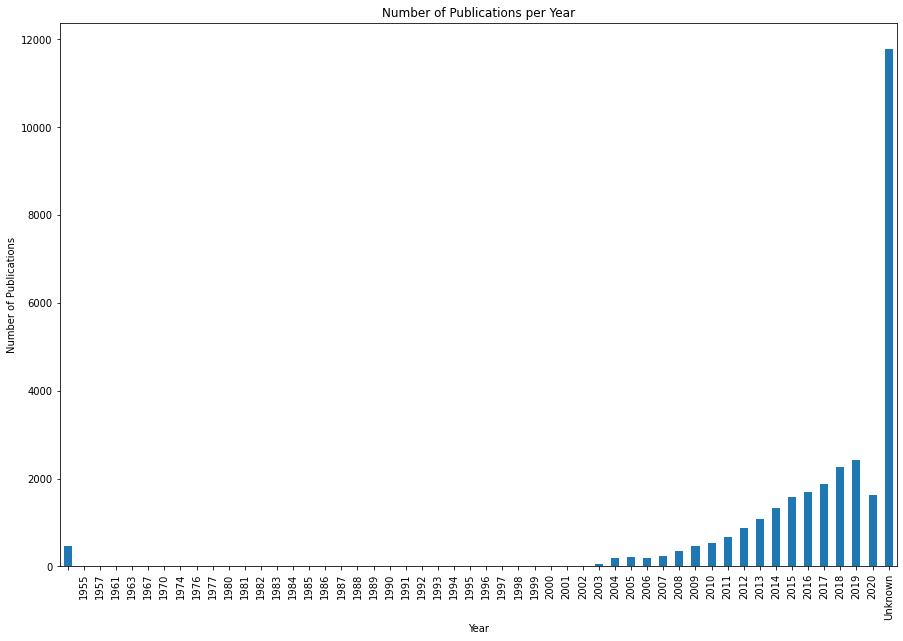

In [ ]:
metadata_pdf = metadata.toPandas()
metadata_pdf['year'] = metadata_pdf['year'].fillna('Unknown')

metadata_pdf['year'].value_counts().sort_index().plot(kind='bar', figsize=(15, 10))
plt.title("Number of Publications per Year")
plt.xlabel("Year")
plt.ylabel("Number of Publications")
plt.show()

##### Some insights for year distribution:
  - Most of the data is concentrated in recent years, indicating a growing trend of publications.
  - Very few publications exist in earlier years, which could signify missing data or limited data availability historically.
  - Number of Unknowns is significant which affects the featrue.

In [ ]:
# Aggregate the has_full_text column into two categories
aggregated_df = metadata.withColumn(
    "has_test_category",
    when(col("has_full_text") == "True", "has_test").otherwise("don't has_test")
).groupBy("has_test_category").agg(count("*").alias("count"))

# Collect the results for plotting
data = aggregated_df.collect()
categories = [row["has_test_category"] for row in data]
counts = [row["count"] for row in data]


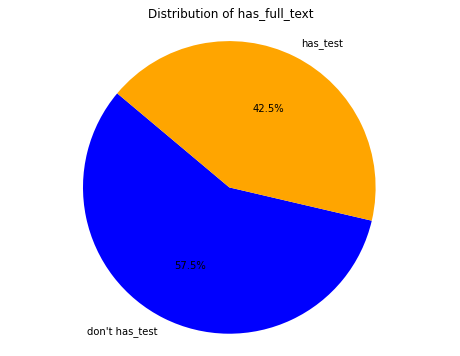

In [ ]:
plt.figure(figsize=(8, 6))
plt.pie(counts, labels=categories, autopct='%1.1f%%', startangle=140, colors=["blue", "orange"])
plt.title("Distribution of has_full_text")
plt.axis('equal')  # Ensures the pie chart is circular
plt.show()

###### Some insights for the pie chart:
- Around 57.5% of the data has full text available.
- The remaining 42.5% doesn't have full text, which might indicate the need for alternative sources to fill in the missing information for certain analyses.

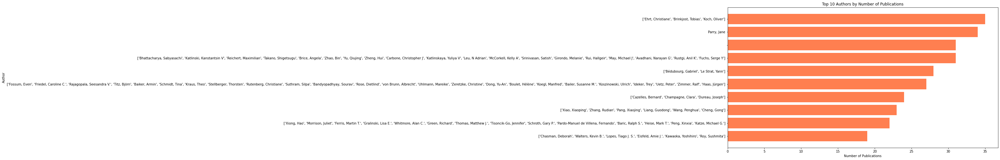

In [ ]:
top_authors = metadata.selectExpr("explode(split(authors, ';')) as author") \
    .groupBy("author").count().orderBy("count", ascending=False).limit(10).toPandas()
plt.figure(figsize=(15, 8))
plt.barh(top_authors["author"], top_authors["count"], color="coral")
plt.title("Top 10 Authors by Number of Publications")
plt.xlabel("Number of Publications")
plt.ylabel("Author")
plt.gca().invert_yaxis()
plt.show()


### 3. Preparation and Cleaning the data

In [ ]:
load_latest_checkpoint(checkpoint="original_pq")

In [ ]:
# Check the number of partitions
comm_use_partitions         = comm_use_subset.rdd.getNumPartitions()
noncomm_use_partitions      = noncomm_use_subset.rdd.getNumPartitions()
biorxiv_medrxiv_partitions  = biorxiv_medrxiv.rdd.getNumPartitions()
metadata_partitions         = metadata.rdd.getNumPartitions()

print(f"comm_use_subset partitions: {comm_use_partitions}")
print(f"noncomm_use_subset partitions: {noncomm_use_partitions}")
print(f"biorxiv_medrxiv partitions: {biorxiv_medrxiv_partitions}")
print(f"metadata partitions: {metadata_partitions}")

comm_use_subset partitions: 10
noncomm_use_subset partitions: 7
biorxiv_medrxiv partitions: 7
metadata partitions: 8


In [ ]:
# For comm_use_subset.
comm_use_subset = comm_use_subset.repartition(16) 

# For noncomm_use_subset
noncomm_use_subset = noncomm_use_subset.repartition(8) 

# For biorxiv_medrxiv
biorxiv_medrxiv = biorxiv_medrxiv.repartition(8) 

# # For metadata
# metadata = metadata.repartition(8) 


In [ ]:
def process_json_files_data(subset):
    # Extract and clean key fields
    subset = subset.select(
        # Authors: Concatenate first and last names
        F.array_join(
            F.transform("metadata.authors", 
                        lambda author: F.concat(author.first, F.lit(' '), author.last)), 
            ","
        ).alias('authors'),
        
        # Abstract: Join arrays into strings or set default
        # F.when(F.col('abstract').isNotNull(), 
        #       F.array_join(F.col('abstract.text'), " "))
        # .otherwise(F.lit("No abstract available"))
        # .alias('abstract'),
        
        # # Body Text: Join arrays into strings or set default
        # F.when(F.col('body_text').isNotNull(), 
        #        F.array_join(F.col('body_text.text'), " "))
        #  .otherwise(F.lit("No body text available"))
        #  .alias('body_text'),
        
        # Title
        F.col('metadata.title').alias('title'),
        
        # # Paper ID
        # F.col('paper_id').alias('paper_id'),
        
        # # Bibliographic and reference entry counts
        # F.size(F.col('bib_entries')).alias('num_bib_entries'),
        # F.size(F.col('ref_entries')).alias('num_ref_entries')
    )

    return subset

In [ ]:
comm_use_subset     = process_json_files_data(comm_use_subset)
noncomm_use_subset  = process_json_files_data(noncomm_use_subset)
biorxiv_medrxiv     = process_json_files_data(biorxiv_medrxiv)

In [ ]:
display(comm_use_subset)

authors,abstract,title
"Ching Sze,Yee-Joo Tan,Jose Nieva,Luis Carrasco","Viroporins are small, hydrophobic trans-membrane viral proteins that oligomerize to form hydrophilic pores in the host cell membranes. These proteins are crucial for the pathogenicity and replication of viruses as they aid in various stages of the viral life cycle, from genome uncoating to viral release. In addition, the ion channel activity of viroporin causes disruption in the cellular ion homeostasis, in particular the calcium ion. Fluctuation in the calcium level triggers the activation of the host defensive programmed cell death pathways as well as the inflammasome, which in turn are being subverted for the viruses' replication benefits. This review article summarizes recent developments in the functional investigation of viroporins from various viruses and their contributions to viral replication and virulence. Recent categorization places viroporins into two major classes based on the number of TMD that are then further classified into A or B subclasses based on their membrane topology [2] . Single TMD viroporins in subclass A have their N terminus facing the ER lumen while those in subclass B have their C-terminal tails in the ER lumen. For Class IIA and IIB viroporins, both N-and C-terminus are inside the ER lumen or the cytoplasmic matrix, respectively (Figure 1 ). An additional third class of viroporins may be necessary as viroporins with three-pass TMD have been proposed, such as the non-structural protein 4 (NSP4) of rotavirus [49] and 3a of severe acute respiratory syndrome SARS-CoV [31]. Due to their high structural variability under different conditions, solving the architecture of viroporins under physiological environment has been difficult. However, recent advancement in technology such as the ability to characterize protein structure at the atomic resolution using nuclear magnetic resonance (NMR)",Viral Membrane Channels: Role and Function in the Virus Life Cycle
"Jacob Kocher,Lisa Lindesmith,Kari Debbink,Anne Beall,Michael Mallory,Boyd Yount,Rachel Graham,Jeremy Huynh,J Gates,Eric Donaldson,Ralph Baric,Citation Kocher,J ,Lindesmith Lc,Debbink ,Beall ,Mallory Ml,Yount Bl,Graham Rl,Huynh ,Gates Je,Donaldson Ef,Editor Lipkin,Washington","Emerging zoonotic viral diseases remain a challenge to global public health. Recent surveillance studies have implicated bats as potential reservoirs for a number of viral pathogens, including coronaviruses and Ebola viruses. Caliciviridae represent a major viral family contributing to emerging diseases in both human and animal populations and have been recently identified in bats. In this study, we blended metagenomics, phylogenetics, homology modeling, and in vitro assays to characterize two novel bat calicivirus (BtCalV) capsid sequences, corresponding to strain BtCalV/A10/USA/2009, identified in Perimyotis subflavus near Little Orleans, MD, and bat norovirus. We observed that bat norovirus formed virus-like particles and had epitopes and receptor-binding patterns similar to those of human noroviruses. To determine whether these observations stretch across multiple bat caliciviruses, we characterized a novel bat calicivirus, BtCalV/A10/USA/2009. Phylogenetic analysis revealed that BtCalV/A10/USA/2009 likely represents a novel Caliciviridae genus and is most closely related to Љrecoviruses.Љ Homology modeling revealed that the capsid sequences of BtCalV/A10/USA/2009 and bat norovirus resembled human norovirus capsid sequences and retained host ligand binding within the receptor-binding domains similar to that seen with human noroviruses. Both caliciviruses bound histoblood group antigens in patterns that overlapped those seen with human and animal noroviruses. Taken together, our results indicate the potential for bat caliciviruses to bind histo-blood group antigens and overcome a significant barrier to cross-species transmission. Additionally, we have shown that bat norovirus maintains antigenic epito

In [ ]:
metadata = metadata.select('authors','abstract','title')

In [ ]:
# Check the number of partitions
comm_use_partitions         = comm_use_subset.rdd.getNumPartitions()
noncomm_use_partitions      = noncomm_use_subset.rdd.getNumPartitions()
biorxiv_medrxiv_partitions  = biorxiv_medrxiv.rdd.getNumPartitions()

print(f"comm_use_subset partitions: {comm_use_partitions}")
print(f"noncomm_use_subset partitions: {noncomm_use_partitions}")
print(f"biorxiv_medrxiv partitions: {biorxiv_medrxiv_partitions}")

comm_use_subset partitions: 16
noncomm_use_subset partitions: 8
biorxiv_medrxiv partitions: 8


In [ ]:

combined_df = metadata.union(comm_use_subset)\
                      .union(noncomm_use_subset)\
                      .union(biorxiv_medrxiv)

In [ ]:
# Check the number of partitions in the combined DataFrame
num_partitions = combined_df.rdd.getNumPartitions()
print(f"Number of partitions: {num_partitions}")

Number of partitions: 40


In [ ]:
combined_df = combined_df.repartition(16) 

In [ ]:
# UDF for language detection
def detect_language(text):
    try:
        return detect(text) if text else None
    except:
        return None

detect_language_udf = udf(detect_language, StringType())

def extract_and_prepare_columns(subset):
    # Deduplicate based on title and paper_id
    subset = subset.dropDuplicates(['title'])

    # Drop rows where the 'title' column is null
    subset = subset.na.drop(subset=["title"])

    # Handle null values: Replace missing values or drop incomplete rows
    subset = subset.na.fill({'authors': 'Unknown', 'abstract': 'No abstract available'})
    
    # Detect language for both title and abstract
    subset = subset.withColumn('language_title', detect_language_udf(F.col('title')))
    # subset = subset.withColumn('language_abstract', detect_language_udf(F.col('abstract')))

    # Filter to keep only records where either title or abstract is English
    subset = subset.filter(
        ((F.col('language_title') == 'en'))
    )
    
    return subset


In [ ]:
combined_df     = extract_and_prepare_columns(combined_df)

In [ ]:
combined_df.toPandas().describe()

,authors,abstract,title,language_title
count,28525,28525,28525,28525
unique,27120,24901,28525,17
top,Unknown,No abstract available,need to have detailed genetic data for our me...,en
freq,693,2348,1,28441


In [ ]:
print(combined_df.count())

28540


In [ ]:
combined_df.printSchema()

root
 |-- authors: string (nullable = false)
 |-- abstract: string (nullable = false)
 |-- title: string (nullable = true)
 |-- language_title: string (nullable = true)



The following were just trials to extract the DOIs from the dataframes but found out that these were just reference papers DOIs not the DOIs of our papers in the dataset.

```python
from pyspark.sql import functions as F

# Function to extract DOIs for a given BIBREF key with try-except handling
def extract_dois_safe(df, bibref_key):
    try:
        return df.select(
            F.array_join(
                F.transform(
                    F.col(f"bib_entries.{bibref_key}.other_ids.DOI"),
                    lambda doi: F.coalesce(doi, F.lit("No DOI"))  # Replace null within the DOI array
                ),
                ", "
            ).alias("DOIs")
        )
    except Exception as e:
        # Handle missing fields by returning a DataFrame with "No DOI"
        return df.select(F.lit("No DOI").alias("DOIs"))

# List of BIBREF keys to process
bibref_keys = comm_use_subset.selectExpr("bib_entries.*").columns  # Extract all keys under bib_entries

# Combine all results into a single DataFrame
combined_dois = None
for key in bibref_keys:
    doi_subset = extract_dois_safe(comm_use_subset, key)
    combined_dois = doi_subset if combined_dois is None else combined_dois.union(doi_subset)

# Show the combined result
combined_dois.show(truncate=False)

```

In [ ]:
save_checkpoint(checkpoint="cleaned")

### 4. Preprocessing

In [ ]:
load_latest_checkpoint(checkpoint="cleaned")


---

**Input Text:**
  
**"The study was peer-reviewed by experts and published at www.example.com. Figure 1 shows results using DOI 10.1234/abcd, and $500 was invested."**

---

### Step 1: **Remove specific punctuation and special characters**

```python
text = re.sub(r'[!()\[\]{};:\'",<>./?@#$%^&*_~]', '', text)
```

#### Explanation:
This step removes characters like punctuation and special symbols (`!`, `()`, `[`, `]`, `$`, etc.) to simplify the text and focus on the words.

#### Example:
**Input:**  
"The study was peer-reviewed by experts and published at www.example.com."

**Output:**  
"The study was peerreviewed by experts and published at wwwexamplecom"

---

### Step 2: **Remove numbers**

```python
text = re.sub(r'\b\d+\b', '', text)
```

#### Explanation:
This removes standalone numbers (e.g., dates, identifiers, monetary values). The `\b\d+\b` ensures only whole numbers are targeted.

#### Example:
**Input:**  
"DOI 10.1234/abcd, and $500 was invested."

**Output:**  
"DOI /abcd, and $ was invested."

---

### Step 3: **Split text into words**

```python
words = text.split()
```

#### Explanation:
The text is split into individual words based on spaces. This step is essential for further token-level processing like stop-word removal and lemmatization.

#### Example:
**Input:**  
"The study was peerreviewed by experts."

**Output:**  
`["The", "study", "was", "peerreviewed", "by", "experts"]`

---

### Step 4: **Remove custom and common stop words**

```python
stop_words = set(stopwords.words('english'))
all_stop_words = stop_words.union(custom_stop_words)
words = [word for word in words if word not in all_stop_words]
```

#### Explanation:
1. **Stop Words:** Commonly used words (e.g., "the," "and," "was") that don't carry much semantic meaning. These are defined by NLTK's `stopwords`.
2. **Custom Stop Words:** Additional domain-specific terms to exclude (e.g., "doi," "reviewed," "figure").

#### Example:
**Input Words:**  
`["The", "study", "was", "peerreviewed", "by", "experts", "www"]`

**Output Words:**  
`["study", "peerreviewed", "experts"]`

---

### Step 5: **Lemmatize words**

```python
lemmatizer = WordNetLemmatizer()
words = [lemmatizer.lemmatize(word) for word in words]
```

#### Explanation:
Lemmatization reduces words to their base or dictionary form (e.g., "studies" → "study"). This ensures consistent word representation.

#### Example:
**Input Words:**  
`["studies", "experts", "peerreviewed"]`

**Output Words:**  
`["study", "expert", "peerreview"]`

---

### Step 6: **Remove non-alphanumeric tokens**

```python
words = [word for word in words if word.isalnum()]
```

#### Explanation:
This removes any tokens that are not purely alphanumeric (e.g., special characters or punctuation that might remain after earlier processing).

#### Example:
**Input Words:**  
`["study", "peerreview", "example.com"]`

**Output Words:**  
`["study", "peerreview", "examplecom"]`

---

### Step 7: **Join words back into a single string**

```python
return ' '.join(words)
```

#### Explanation:
The cleaned list of words is joined into a single string for further use in downstream tasks.

#### Final Output Example:
**Input Words:**  
`["study", "peerreview", "expert"]`

**Final Output:**  
`"study peerreview expert"`

---

### Complete Transformation of Example Input
**Input:**  
"The study was peer-reviewed by experts and published at www.example.com. Figure 1 shows results using DOI 10.1234/abcd, and $500 was invested."

**Output:**  
`"study peerreview expert published examplecom result"`

In [ ]:
import nltk
nltk.download('stopwords')    # For stopwords
nltk.download('wordnet')      # For lemmatization

# Custom preprocessing function
def preprocess_df(text):
    if not text:
        return None
    
    # Expand contractions
    text = contractions.fix(text)
    
    # Convert to lowercase
    text = text.lower()
    
    # Remove specific punctuation and special characters
    text = re.sub(r'[!()\[\]{};:\'",<>./?@#$%^&*_~]', '', text)
    
    # Remove numbers
    text = re.sub(r'\b\d+\b', '', text)
    
    # split
    words = text.split()
    
    # Remove custom and common stop words
    custom_stop_words = [
        'doi', 'preprint', 'copyright', 'peer', 'reviewed', 'org', 'https', 'et', 'al',
        'author', 'figure', 'rights', 'reserved', 'permission', 'used', 'using',
        'biorxiv', 'medrxiv', 'license', 'fig', 'fig.', 'al.', 'Elsevier', 'PMC', 'CZI', 'www'
    ]
    stop_words = set(stopwords.words('english'))
    all_stop_words = stop_words.union(custom_stop_words)
    words = [word for word in words if word not in all_stop_words]
    
    # Lemmatize words
    lemmatizer = WordNetLemmatizer()
    words = [lemmatizer.lemmatize(word) for word in words]
    
    # Remove non-alphanumeric tokens
    words = [word for word in words if word.isalnum()]
    
    # Join words back to a single string
    return ' '.join(words)


# Define UDF
preprocess_df_udf = F.udf(preprocess_df, StringType())

# Apply the cleaning function directly to the title and abstract columns
combined_df = combined_df.withColumn("title", preprocess_df_udf(col("title")))
combined_df = combined_df.withColumn("abstract", preprocess_df_udf(col("abstract")))

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


In [ ]:
combined_df.toPandas().isnull().sum()

Out[26]: authors             0
abstract          803
title               0
language_title      0
dtype: int64

In [ ]:
display(combined_df.limit(10))

authors,abstract,title,language_title
Unknown,abstract available,adult ixodes persulcatus tick collected two russian region tick cell line irectvm19 one strain persisted irectvm19 cell without cytopathic effect three year virion purified tick cell spherical diameter approximately nm addition,en
"Sandler, Z. J.; Vu, M. N.; Menachery, V. D.; Mounce, B. C.",suggesting disrupting potassium ion homeostasis valinomycin may potent host pathway target quell virus infection,including encephalitis identified several known previously unidentified antiviral focused potassium ionophore,en
Unknown,abstract available,laboratory test virus related indicator urine may needed special patient,en
2019-11-22,morbidity gut barrier result showed exposure promote pedv infection vitro vivo,lead catastrophic economic loss global pig industry primary pathogen coronavirus ped virus pedv growing evidence indicates pathogen infection factor ped outbreak,en
Unknown,abstract available,ten peptide binding mhc class mhc class ii found promising candidate vaccine design adequate world population coverage,en
Unknown,abstract available,adoption vadr free genbank staff spend time service checking routine viral sequence submission,en
"targeted vector control before potential arbovirus outbreaks.""",high tourism area yous,episode appear coincident increased introduction dengue virus region human travel migration endemic country date,en
Unknown,abstract available,comprises million record city town likelihood ranking different model reveal strong evidence interaction form competition among city destination traveler,en
"['Modjarrad, Kayvon', 'Vermund, Sten H.']",commentary elaborate main point karamouzian colleague made hiv data scarcity middle eastern north african mena country without accessible reliable data epidemic managed effectively efficiently clearly increased investment needed bolster capability capture interpret hiv surveillance data believe enhanced capacity achieved part leveraging repurposing existing data platform technology patient cohort immediate modest investment capitalizes available infrastructure generate data hiv burden spread persuasive mena intensify effort track contain growing hiv epidemic region focus key population yield valuable data including among men sex men msm transgender woman men person inject drug pwids female partner high risk men female sex worker,ensuring hiv data availability transparency integrity mena region comment improving quality quantity hiv data middle east north africa key challenge way forward,en
including type II diabetes mellitus,much world population active imminent danger established infectious pathogen sporadic pandemic infection emerging agent threaten everyone rna polymerase rnapol generate enormous genetic consequent antigenic heterogeneity permitting virus cellular pathogen evade host defence thus rnapol cause morbidity premature mortality molecule extraordinary genetic heterogeneity defining viral quasispecies result rnapol infidelity causing rapid cumulative genomic rna mutation process uncontrolled would cause catastrophic loss sequence integrity inexorable quasispecies extinction selective replication replicative homeostasis epicyclical regulatory mechanism dynamically linking rnapol fidelity processivity quasispecies phenotypic diversity modulating polymerase fidelity hence controlling quasispecies behaviour prevents happening also mediates immune escape perhaps importantly ineluctable generation broad phenotypic diversity viral rna translated protein quasispecies suggests mechanism disease specifically target functionally disrupts host cell surface molecule including hormone lipid cell signalling neurotransmitter receptor virus cell entry mechanism viral receptor disease vrd may explain viral autoimmunity,replicative homeostasis ii influence polymerase fidelity rna virus quasispecies biology implication immune recognition viral autoimmunity virus receptor disease,en


In [ ]:
save_checkpoint(checkpoint="processed")

### 5. Vectorization

In [ ]:
load_latest_checkpoint(checkpoint="processed")

In [ ]:
# Combine 'title' and 'abstract' columns, handling null values
combined_df = combined_df.withColumn(
    'text',
    F.concat(F.coalesce(F.col('title'), F.lit('')), F.lit(' '), F.coalesce(F.col('abstract'), F.lit('')))
)

In [ ]:
combined_df.toPandas().isnull().sum()

Out[31]: authors             0
abstract          803
title               0
language_title      0
text                0
dtype: int64

In [ ]:
combined_df.count()

Out[32]: 28534

In [ ]:
combined_df.toPandas().describe()

,authors,abstract,title,language_title,text
count,28534,27731,28534,28534,28534
unique,27134,24538,27589,20,28329
top,Unknown,abstract available,,en,abstract available
freq,696,2351,10,28446,4


Observations

Missing Data:

Many rows in the abstract column are missing (difference between count and total rows). Placeholder values like "no abstract available" suggest missing data.

Dominant Language:

Most titles are in English ("en" appears 28,446 times).

Non-Unique Titles and Text:

TEXT has 28329 unique values, meaning some titles are repeated.


In [ ]:
display(combined_df.limit(10))

authors,abstract,title,language_title,text
Unknown,abstract available,beijing hong kong also obtained estimated doubling time,en,beijing hong kong also obtained estimated doubling time abstract available
True,abstract available,quantification target pathogen breeding program assay also application routine diagnostics,en,quantification target pathogen breeding program assay also application routine diagnostics abstract available
Unknown,abstract available,geographic,en,geographic abstract available
Unknown,wilkinson joffrin l lebarbenchon c mavingui p,however,en,however wilkinson joffrin l lebarbenchon c mavingui p
Unknown,abstract available,reduced retinoic acid responded apical basolateral stimulation nasal polyp tissue,en,reduced retinoic acid responded apical basolateral stimulation nasal polyp tissue abstract available
Unknown,even limited amount sequence highly unbalanced available data deep neural network trained approach build core predicting tool vidhop virus deep learning host prediction,based viral genome sequence ensure high prediction accuracy,en,based viral genome sequence ensure high prediction accuracy even limited amount sequence highly unbalanced available data deep neural network trained approach build core predicting tool vidhop virus deep learning host prediction
and case and product liability law. Remarkably,right health relevant information derives principle autonomy self direction recognised international declaration providing accurate health information part basis obtaining informed consent recognised component business ethic,safe enough smoker right know safe tobacco product,en,safe enough smoker right know safe tobacco product right health relevant information derives principle autonomy self direction recognised international declaration providing accurate health information part basis obtaining informed consent recognised component business ethic
2020,abstract available,comment preliminary estimation basic reproduction number novel coronavirus china,en,comment preliminary estimation basic reproduction number novel coronavirus china abstract available
specificity and positive predictive value. The next step will include the prospective monitoring of syndromic activity,background science syndromic surveillance still much infancy number syndromic surveillance system evaluated u success thus far predicting infectious disease event furthermore date majority syndromic surveillance system based primarily emergency department setting varying level enhancement data source research done value telephone helplines health care use patient satisfaction project looked telephone helpline source data syndromic surveillance none attempted canada notable exception statement uk research national nh direct system syndromic surveillance tool conducted methodsdesign purpose proposed study evaluate effectiveness ontario telephone nursing helpline system syndromic surveillance system implementation successful would impact outbreak event detection ontario data collected retrospectively reason call assigned algorithm linked syndrome category different analytic method,ontario telehealth health telephone helpline system study protocol,en,ontario telehealth health telephone helpline system study protocol background science syndromic surveillance still much infancy number syndromic surveillance system evaluated u success thus far predicting infectious disease event furthermore date majority syndromic surveillance system based primarily emergency department setting varying level enhancement data source research done value telephone helplines health care use patient satisfaction project looked telephone helpline source data syndromic surveillance none attempted canada notable exception statement uk research national nh direct system syndromic surveillance tool conducted methodsdesign purpose proposed study evaluate effectiveness ontario telephone nursing helpline system syndromic surveillance system implementation successful would i

Core Idea of Word2Vec

Word2Vec learns word embeddings by predicting the relationship between a target word and its context. Depending on the architecture:

Skip-Gram: Predicts the surrounding context words given a target word.

CBOW: Predicts the target word given the surrounding context words.

Output:
After training, the embedding matrix contains the word embeddings:

Each word corresponds to a dense vector of a fixed size (e.g., 100 dimensions).
Words with similar meanings are close to each other in this embedding.


Limitations

Context Insensitivity:

Spark’s Word2Vec does not retain word order or positional context, which might be important for some tasks.
This can be mitigated by using more advanced models like GloVe, FastText, or transformers.

Averaging for Document Embeddings:

Averaging word embeddings for document representation might oversimplify complex relationships.

Large Vocabulary Size:

The minCount parameter helps mitigate memory issues by ignoring infrequent words, but for very large corpora, training can still be resource-intensive


In [ ]:
# Tokenize the cleaned text
tokenizer = Tokenizer(inputCol="text", outputCol="tokens")
combined_df = tokenizer.transform(combined_df)

# Apply Word2Vec
word2vec = Word2Vec(vectorSize=100, minCount=5, inputCol="tokens", outputCol="features")
word2vec_model = word2vec.fit(combined_df)
combined_df = word2vec_model.transform(combined_df)

**vectorSize=100**
This determines the dimensionality of the word embeddings.

What it means: Each word will be represented as a dense vector in a 100-dimensional space.

Impact:

Larger vectorSize: Captures more nuanced relationships but requires more computation and memory.

Smaller vectorSize: Faster to compute and less resource-intensive but may miss finer details in word relationships.

Typical Range: Common values are 50, 100, 200, or 300, depending on the complexity of the task and available resources.

---

**minCount=5**
This sets the minimum frequency threshold for a word to be included in the vocabulary.

What it means: Words that appear fewer than minCount times in the dataset are ignored.

Impact:

Lower minCount (e.g., 1): Includes rare words, increasing vocabulary size but potentially adding noise.

Higher minCount: Focuses on frequent words, reducing vocabulary size and computational load but potentially losing important rare words.

In [ ]:
display(combined_df.limit(10))

authors,abstract,title,language_title,text,tokens,features
Unknown,no abstract available,beijing and hong kong during 2002-2003 were also obtained we estimated the doubling time,en,beijing and hong kong during 2002-2003 were also obtained we estimated the doubling time no abstract available,"List(beijing, and, hong, kong, during, 2002-2003, were, also, obtained, we, estimated, the, doubling, time, no, abstract, available)","Map(vectorType -> dense, length -> 100, values -> List(-0.02118112924782669, -0.014997648431316894, 0.09701381163562045, -0.059530024608487594, 0.02511808422038003, -0.11558595822904916, -0.01761892522849581, 0.22872151297462337, 0.05565499834825887, -0.10107444007607067, 0.10817988830454209, -0.10167485472800977, -0.10048783559571293, 0.09520011033643694, 0.02403550614219378, 0.08764026752289604, 0.002421504653551999, 0.06430336449514416, -0.02680520529803984, -0.0815896346945973, 0.11424668900230352, 0.12085682838497792, 0.1930492504992906, -0.03142157240825541, 0.0031356501721722238, -0.023497357800164643, -0.0751367275712683, -0.13403917909325921, 0.09446580220452126, -0.04248421726857914, 0.00794866944060606, -0.07695936225354671, -0.11802449526593965, -0.028549458393279242, 0.01152756976593724, 0.018035774886169854, -0.14820256664910736, -0.12463851809939917, -0.15811851719284759, 0.026733415146522662, -0.02804966621539172, -0.07474794238805771, 0.07150245353798655, -0.06292152634876616, -7.043908185818616E-4, 2.647152937510434E-4, -0.054273182635798174, -0.19908751158800442, -0.0032377479159656692, 0.1210225330775275, 0.05485180907827966, 0.039727451854988056, 0.03417720993542496, 0.047106197651694805, 0.00267245719099746, -0.18407149771776268, -0.03386003217276405, -0.0013024416916510638, 0.18069000414449393, 0.022924536948694903, 0.10732036412638776, 0.13197243903927944, 0.06437431356308106, 0.033322309919372746, -0.13448375244350994, 0.059803405310958624, 0.18031469305210254, -0.06694527121041627, 0.25904158217942014, -0.07548917550593615, -0.012222638025003322, -0.13816459375597975, -0.1112634490846711, -0.0018199974232736755, -0.10348293053753235, 0.007092047482728958, -0.06763680838048458, -0.046997216804062616, 0.0912275905994808, -0.154321212978924, -0.21250833976356423, -0.1469366165864117, 0.11956858224071124, 0.08622495095957727, -0.0674142832730842, 0.046131817596581054, 0.06767198437249616, 0.04620694487547392, -0.1403034311335753, 0.06518346290378009, 0.00857828842366443, -0.06476183618446264, 0.015869183904107877, 0.06309012060656267, -0.09785622763721381, -0.18956605345010757, -0.010054826734738205, -0.16327143379706233, 0.14067104436895425, 0.04282266054959858))"
True,no abstract available,and quantification of target pathogens in a breeding program the assay also has applications in routine diagnostics,en,and quantification of target pathogens in a breeding program the assay also has applications in routine diagnostics no abstract available,"List(and, quantification, of, target, pathogens, in, a, breeding, program, the, assay, also, has, applications, in, routine, diagnostics, no, abstract, available)","Map(vectorType -> dense, length -> 100, values -> List(0.018967412714846435, -0.014445316046476364, 0.08580825584940613, -0.038701048842631286, -0.0067638183652888985, 0.06645080149173736, -0.06124294823966921, 0.09245099048130215, 0.04649722771719098, -0.07242171462858096, 0.004810522124171258, -0.07579764174297453, -0.14978188322857022, 0.07213111245073378, -0.07175801545381547, -0.14680944788269698, 0.017688970966264605, -0.034471286821644756, -0.081761160120368, -0.03962500961497426, 0.04509890265762806, 0.07703720987774432, -0.024861234286800028, -0.08479713597334922, -0.2273335461737588, 0.03476399718783796, -0.0025596089428290727, -0.04032008202048019, 0.03472817612346262, -0.048045008257031445, 0.03810614496469498, -1.6444511711597443E-4, -0.06666702143847943, -0.08733125920407475, -0.005210545181762428, 0.09876305660000072, -0.01647888794541359, 0.1609744700312149, -0.046453

In [ ]:
combined_df.count()

Out[73]: 28534

In [ ]:
combined_df.printSchema()

root
 |-- authors: string (nullable = true)
 |-- abstract: string (nullable = true)
 |-- title: string (nullable = true)
 |-- language_title: string (nullable = true)
 |-- text: string (nullable = false)
 |-- tokens: array (nullable = true)
 |    |-- element: string (containsNull = true)
 |-- features: vector (nullable = true)



In [ ]:
save_checkpoint(checkpoint="vectorized")

### 6. Clustering

In [ ]:
load_latest_checkpoint(checkpoint="vectorized")

WE SCALE DATA BEFORE USING PCA WHICH PRESERVES RELATIONSHIPS BETWEEN FEATURES.

Using StandardScaler after vectorizing data with Word2Vec can significantly impact the performance of KMeans

Why Scaling Can Help:

KMeans Sensitivity to Scale:

KMeans relies on Euclidean distances to assign clusters.

If your Word2Vec vectors have varying magnitudes, features with larger values dominate the clustering process, potentially skewing results.

Word2Vec Embeddings:

Word2Vec embeddings inherently encode semantic similarity, but their magnitudes may vary depending on corpus size, context, and training.
Scaling ensures embeddings contribute equally to distance calculations in KMeans.



In [ ]:
from pyspark.ml.feature import StandardScaler, PCA
from pyspark.ml.clustering import KMeans
from pyspark.ml.evaluation import ClusteringEvaluator
from pyspark.sql.functions import col
import matplotlib.pyplot as plt
import numpy as np

# 1. Preprocessing
# Filter rows with null features
df = combined_df.filter(col('features').isNotNull())

# Normalize the features
scaler = StandardScaler(inputCol='features', outputCol='scaled_features', withStd=True, withMean=False)
scaled_model = scaler.fit(df)
scaled_df = scaled_model.transform(df)

# 2. Dimensionality Reduction using PCA
pca = PCA(k=10, inputCol='scaled_features', outputCol='pca_features')
pca_model = pca.fit(scaled_df)
explained_variance = pca_model.explainedVariance
num_components = (explained_variance.cumsum() <= 0.95).sum() + 1
print(f"No of PC: {num_components}")

# Apply PCA with the chosen number of components
pca = PCA(k=num_components, inputCol='scaled_features', outputCol='pca_features')
pca_model = pca.fit(scaled_df)
pca_df = pca_model.transform(scaled_df)


No of PC: 11


##### BEST K USING Silhouette Score

Optimal k determined using Silhouette Score: 2


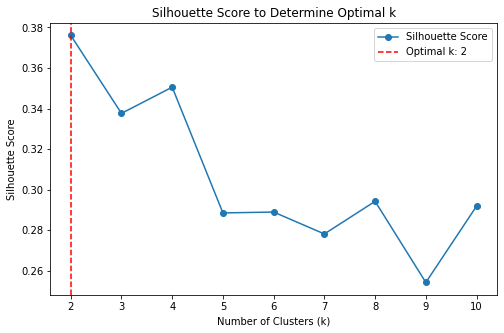

In [ ]:
from pyspark.ml.clustering import KMeans
from pyspark.ml.evaluation import ClusteringEvaluator

# Define the range of k to evaluate
k_values = range(2, 11)
silhouette_scores = []

# Loop through each k, fit the model, and calculate the Silhouette Score
for k in k_values:
    kmeans = KMeans(featuresCol='pca_features', k=k, seed=42)
    model = kmeans.fit(pca_df)
    
    # Assign clusters to data
    clustered_df = model.transform(pca_df)
    
    # Evaluate the Silhouette Score
    evaluator = ClusteringEvaluator(featuresCol='pca_features', predictionCol='prediction', metricName='silhouette')
    silhouette_score = evaluator.evaluate(clustered_df)
    silhouette_scores.append(silhouette_score)

# Find the k with the maximum Silhouette Score
optimal_k = k_values[silhouette_scores.index(max(silhouette_scores))]
print(f"Optimal k determined using Silhouette Score: {optimal_k}")

# Plot the Silhouette Scores
plt.figure(figsize=(8, 5))
plt.plot(k_values, silhouette_scores, marker='o', label='Silhouette Score')
plt.axvline(optimal_k, color='r', linestyle='--', label=f'Optimal k: {optimal_k}')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score to Determine Optimal k')
plt.legend()
plt.show()

# Fit the final model with the optimal k
kmeans = KMeans(featuresCol='pca_features', k=optimal_k, seed=42)
model = kmeans.fit(pca_df)

# Assign clusters to data
final_clustered_df = model.transform(pca_df)

##### BEST K USING Elbow Method

Optimal k determined programmatically: 5


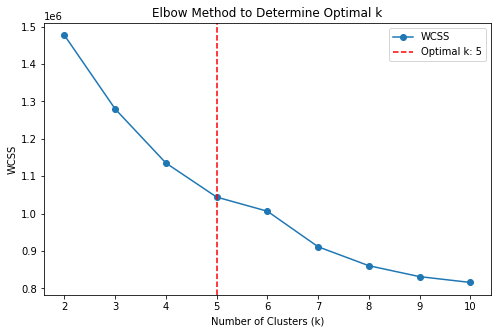

Silhouette Score: 0.2885444387805472


In [ ]:
# 3. Clustering
# Find the best k using Elbow Method

cost = []
for k in range(2, 11):
    kmeans = KMeans(featuresCol='pca_features', k=k, seed=42)
    model = kmeans.fit(pca_df)
    cost.append(model.summary.trainingCost)

# 4. Calculate Optimal K
# optimal_k = cost.index(min(cost)) + 2
# Calculate the first derivative (rate of change)
first_derivative = np.diff(cost)

# Calculate the second derivative (rate of change of the rate of change)
second_derivative = np.diff(first_derivative)

# Find the elbow point (highest negative value in second derivative)
optimal_k = np.argmin(second_derivative) + 2  # Adjust for index shift
print(f"Optimal k determined programmatically: {optimal_k}")

plt.figure(figsize=(8, 5))
plt.plot(range(2, 11), cost, marker='o', label='WCSS')
plt.axvline(optimal_k, color='r', linestyle='--', label=f'Optimal k: {optimal_k}')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('WCSS')
plt.title('Elbow Method to Determine Optimal k')
plt.legend()
plt.show()

# 5. Fit the model with the optimal k
kmeans = KMeans(featuresCol='pca_features', k=optimal_k, seed=42)
model = kmeans.fit(pca_df)

# Assign clusters to data
clustered_df = model.transform(pca_df)

# 6. Evaluate Clustering
evaluator = ClusteringEvaluator(featuresCol='pca_features', predictionCol='prediction', metricName='silhouette')
silhouette_score = evaluator.evaluate(clustered_df)
print(f'Silhouette Score: {silhouette_score}')

# Show clustered data
# clustered_df.select('authors', 'title', 'abstract', 'text', 'tokens', 'prediction').show(truncate=False)


REGARDING Silhouette BEST K = 2,4, FOR Elbow BEST K = 5

**Elbow Method:** Focuses on the rate of decrease in within-cluster sum of squares (WCSS). It may favor more clusters if adding clusters marginally reduces WCSS.

**Silhouette Score:** Measures cluster compactness and separation, favoring well-defined and distinct clusters.

**What to Choose:**

Use Silhouette Score if:

You prioritize quality over quantity of clusters.

Your goal is to ensure the clusters are distinct and meaningful, especially for interpretability.

Use Elbow Method if:

Your application benefits from capturing granular patterns in the data.

You expect clusters to capture subtle groupings, even at the cost of slight overlap.

LET'S SEE HOW MUCH VARIANCE WE CAN GET WITH FIRST 2,3 PC

Variance explained by first 3 components:
PC1: 0.227 (22.7% cumulative)
PC2: 0.098 (32.5% cumulative)
PC3: 0.072 (39.7% cumulative)


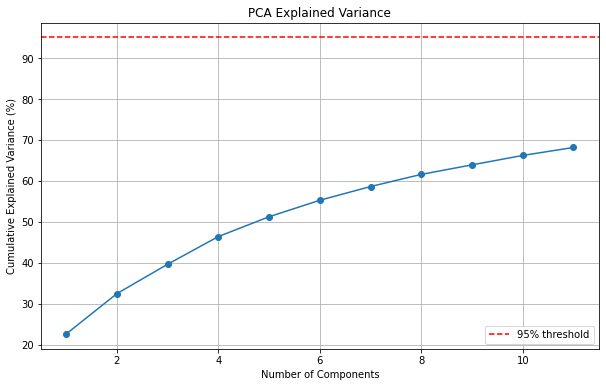

In [ ]:
# Initial PCA with 11 components which explain 95% of our variance 
pca = PCA(k=11, inputCol='scaled_features', outputCol='pca_features')
pca_model = pca.fit(scaled_df)
explained_variance = pca_model.explainedVariance
cumulative_variance = np.cumsum(explained_variance)

# Print variance for first 3 components
print("Variance explained by first 3 components:")
for i in range(3):
    print(f"PC{i+1}: {explained_variance[i]:.3f} ({cumulative_variance[i]*100:.1f}% cumulative)")

# Visualize variance
plt.figure(figsize=(10, 6))
plt.plot(range(1, 12), cumulative_variance * 100, marker='o')
plt.axhline(y=95, color='r', linestyle='--', label='95% threshold')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance (%)')
plt.title('PCA Explained Variance')
plt.grid(True)
plt.legend()
plt.show()

Visualization for 2,3 PC

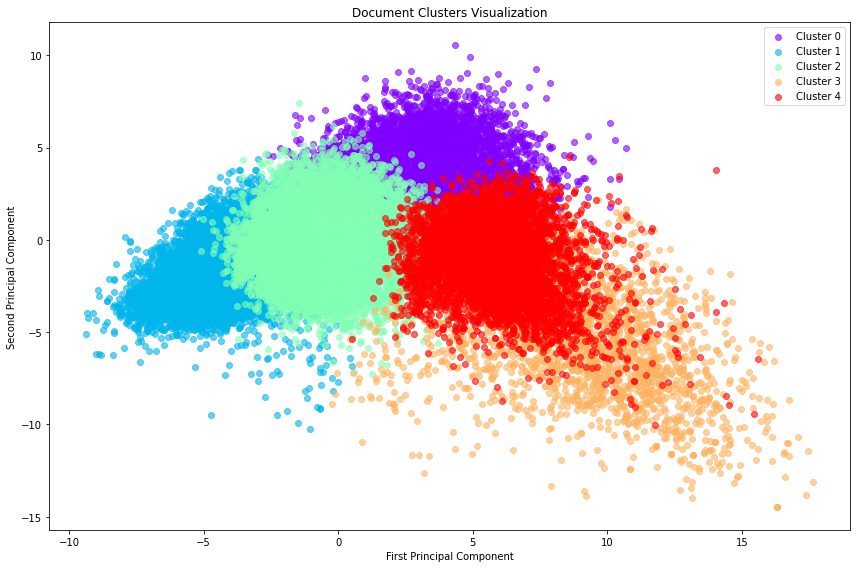

In [ ]:
from pyspark.ml.feature import StandardScaler, PCA
from pyspark.ml.clustering import KMeans
from pyspark.ml.evaluation import ClusteringEvaluator
from pyspark.sql.functions import col, udf
from pyspark.sql.types import ArrayType, DoubleType
from pyspark.ml.linalg import VectorUDT, Vectors
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# Convert vector to array UDF
vector_to_array = udf(lambda vec: vec.toArray().tolist(), ArrayType(DoubleType()))

# Extract features as arrays
features_df = clustered_df.select(
    'prediction',
    vector_to_array('pca_features').alias('features_array')
)

# Convert to pandas and extract components
pandas_df = features_df.toPandas()
pandas_df['PC1'] = pandas_df['features_array'].apply(lambda x: x[0])
pandas_df['PC2'] = pandas_df['features_array'].apply(lambda x: x[1])
pandas_df['PC3'] = pandas_df['features_array'].apply(lambda x: x[2])

# Create scatter plot
plt.figure(figsize=(12, 8))
unique_clusters = sorted(pandas_df['prediction'].unique())
colors = plt.cm.rainbow(np.linspace(0, 1, len(unique_clusters)))

for cluster, color in zip(unique_clusters, colors):
    mask = pandas_df['prediction'] == cluster
    plt.scatter(
        pandas_df.loc[mask, 'PC1'],
        pandas_df.loc[mask, 'PC2'],
        label=f'Cluster {cluster}',
        color=color,
        alpha=0.6
    )

plt.title('Document Clusters Visualization')
plt.xlabel('First Principal Component')
plt.ylabel('Second Principal Component')
plt.legend()
plt.tight_layout()
plt.show()


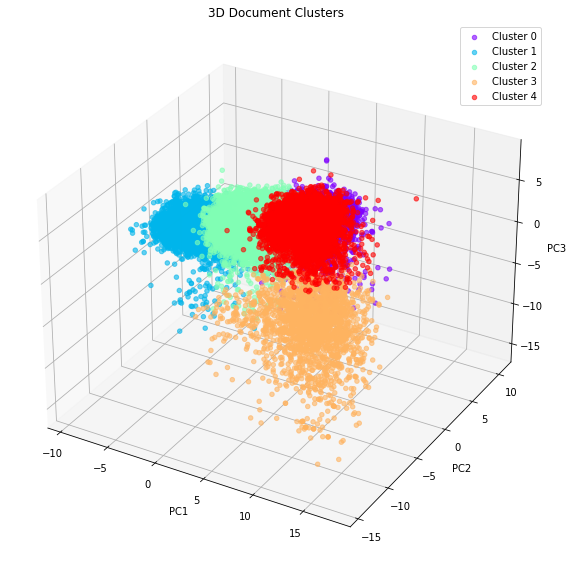

In [ ]:
# 3D visualization
fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')

for cluster, color in zip(unique_clusters, colors):
    mask = pandas_df['prediction'] == cluster
    ax.scatter(
        pandas_df.loc[mask, 'PC1'],
        pandas_df.loc[mask, 'PC2'],
        pandas_df.loc[mask, 'PC3'],
        label=f'Cluster {cluster}',
        color=color,
        alpha=0.6
    )

ax.set_title('3D Document Clusters')
ax.set_xlabel('PC1')
ax.set_ylabel('PC2')
ax.set_zlabel('PC3')
plt.legend()
plt.tight_layout()
plt.show()

In [ ]:
import plotly.express as px
import plotly.io as pio

# Set Plotly renderer for Databricks
pio.renderers.default = 'databricks'

# Create a dataframe for Plotly
pandas_df['Cluster'] = pandas_df['prediction'].astype(str)  # Convert cluster labels to strings for Plotly

# Create the interactive 3D scatter plot
fig = px.scatter_3d(
    pandas_df,
    x='PC1',
    y='PC2',
    z='PC3',
    color='Cluster',
    title='3D Document Clusters',
    labels={'PC1': 'PC1', 'PC2': 'PC2', 'PC3': 'PC3'},
    opacity=0.6
)

# Customize the layout
fig.update_layout(
    scene=dict(
        xaxis_title='PC1',
        yaxis_title='PC2',
        zaxis_title='PC3'
    ),
    legend_title='Clusters'
)

# Show the plot
fig.show()


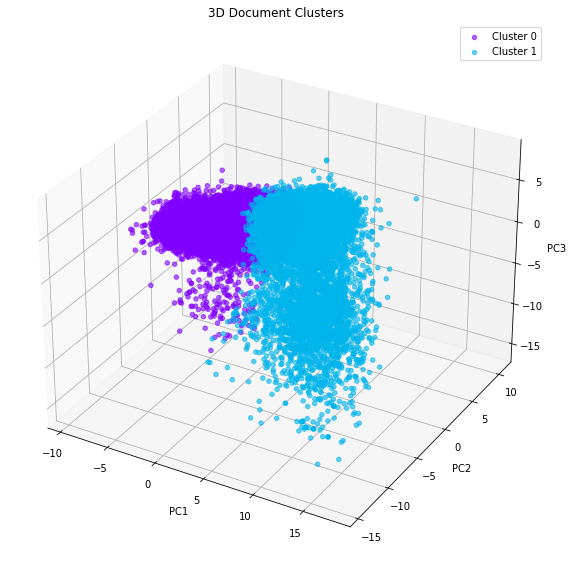

In [ ]:
# 3D visualization FOR Optimal k determined using Silhouette Score: 2


# Extract features as arrays
features_df = final_clustered_df.select(
    'prediction',
    vector_to_array('pca_features').alias('features_array')
)

# Convert to pandas and extract components
pandas_df = features_df.toPandas()
pandas_df['PC1'] = pandas_df['features_array'].apply(lambda x: x[0])
pandas_df['PC2'] = pandas_df['features_array'].apply(lambda x: x[1])
pandas_df['PC3'] = pandas_df['features_array'].apply(lambda x: x[2])

# 3D visualization
fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')
unique_clusters = sorted(pandas_df['prediction'].unique())

for cluster, color in zip(unique_clusters, colors):
    mask = pandas_df['prediction'] == cluster
    ax.scatter(
        pandas_df.loc[mask, 'PC1'],
        pandas_df.loc[mask, 'PC2'],
        pandas_df.loc[mask, 'PC3'],
        label=f'Cluster {cluster}',
        color=color,
        alpha=0.6
    )

ax.set_title('3D Document Clusters')
ax.set_xlabel('PC1')
ax.set_ylabel('PC2')
ax.set_zlabel('PC3')
plt.legend()
plt.tight_layout()
plt.show()

In [ ]:
import plotly.express as px
import plotly.io as pio

# Set Plotly renderer for Databricks
pio.renderers.default = 'databricks'

# Create a dataframe for Plotly
pandas_df['Cluster'] = pandas_df['prediction'].astype(str)  # Convert cluster labels to strings for Plotly

# Create the interactive 3D scatter plot
fig = px.scatter_3d(
    pandas_df,
    x='PC1',
    y='PC2',
    z='PC3',
    color='Cluster',
    title='3D Document Clusters',
    labels={'PC1': 'PC1', 'PC2': 'PC2', 'PC3': 'PC3'},
    opacity=0.6
)

# Customize the layout
fig.update_layout(
    scene=dict(
        xaxis_title='PC1',
        yaxis_title='PC2',
        zaxis_title='PC3'
    ),
    legend_title='Clusters'
)

# Show the plot
fig.show()


##### Save our processed dataframe as delta.

In [ ]:
# Define Delta table path (Databricks or cloud storage)
delta_path = "/FileStore/tables/COVID/delta/processed_papers"

# Save as Delta format
clustered_df.write.format("delta").mode("overwrite").save(delta_path)

# OR, If saving to a metastore table
clustered_df.write.format("delta").mode("overwrite").saveAsTable("processed_papers")

In [ ]:
save_checkpoint(checkpoint="clustered")

### 7. Recommender system

In [ ]:
load_latest_checkpoint(checkpoint="clustered")

In [ ]:
# Read the Delta table
clustered_df = spark.read.format("delta").load(delta_path)

# Show the first few rows
clustered_df.show()


+--------------------+--------------------+--------------------+--------------+--------------------+--------------------+--------------------+--------------------+--------------------+----------+
|             authors|            abstract|               title|language_title|                text|              tokens|            features|     scaled_features|        pca_features|prediction|
+--------------------+--------------------+--------------------+--------------+--------------------+--------------------+--------------------+--------------------+--------------------+----------+
|             Unknown|no abstract avail...|beijing and hong ...|            en|beijing and hong ...|[beijing, and, ho...|[-0.0211811292478...|[-0.4802763565315...|[-10.611545159222...|         2|
|                True|no abstract avail...|and quantificatio...|            en|and quantificatio...|[and, quantificat...|[0.01896741271484...|[0.43008093501206...|[-7.2883660253564...|         2|
|             Unknow

In [ ]:
from sklearn.metrics.pairwise import cosine_similarity
from pyspark.sql.functions import col, split, lower

def recommendPaper(title, N):
    # Transform input title to a Spark DataFrame
    sample_df = spark.createDataFrame([title], "string").toDF("title")
    
    # Tokenize the title into a column named 'tokens' (expected by Word2Vec)
    sample_df = sample_df.withColumn("tokens", split(lower(col("title")), " "))

    # Apply Word2Vec to generate vector representation
    sample_df_word2Vec = word2vec_model.transform(sample_df)

    # Scale the features using the scaler model
    sample_df_scaled = scaled_model.transform(sample_df_word2Vec)

    # Apply PCA for dimensionality reduction
    sample_df_pca = pca_model.transform(sample_df_scaled)

    # Predict the cluster using the clustering model
    sample_cluster = model.transform(sample_df_pca)
    predict_cluster = sample_cluster.select("prediction").first()["prediction"]

    # Filter the data for the predicted cluster
    predict_cluster_df = clustered_df.filter(col("prediction") == predict_cluster)

    # Compute cosine similarity
    def compute_cosine_similarity(row):
        return (
            row["title"],
            row["title_item"],
            float(cosine_similarity([row["pca_features"]], [row["pcaFeatures_item"]])[0, 0]),
        )

    cosine_similarity_df = (
        predict_cluster_df.crossJoin(sample_df_pca.select(col("title").alias("title_item"), col("pca_features").alias("pcaFeatures_item")))
        .rdd.map(compute_cosine_similarity)
        .toDF(["title", "title_item", "cosine_similarity"])
    )

    # Rank by similarity and return top N
    cosine_similarity_df = cosine_similarity_df.orderBy(col("cosine_similarity").desc())
    return list(cosine_similarity_df.select("title").toPandas()["title"][:N])


In [ ]:
recommendations = recommendPaper("COVID-19 and its Variants", 5)
print("Recommended Papers:", recommendations)


Recommended Papers: ['quantification target pathogen breeding program assay also application routine diagnostics', 'however', 'based viral genome sequence ensure high prediction accuracy', 'e38241 china national project china national natural science foundation china', '3d assembly novel approach investigate interaction']


Workflow:

* Input title: "COVID-19 and its Variants".

* Tokenization: ["COVID-19", "and", "its", "Variants"].

* Word2Vec: Generates a vector representation for the title.

* Scaling and PCA: Produces a lower-dimensional representation.

* Cluster Prediction: Predicts the cluster (e.g., Cluster 5) for this title.

* Filter by Cluster: Retrieves all papers in Cluster 5.

* Cosine Similarity: Compares the input title's vector with each paper's vector in Cluster 5.

* Ranking: Selects the top 5 papers with the highest similarity scores.

